
===================================================================================================
# Test the hologram performances with HD111980 data 09 jun 2017
==================================================================================================

- author : Sylvie
- date   : October 2nd th 2017
- update : October 11th 2017


Inspired from Jeremy's work on PN and QSO

> This notebook start from images that has been deflated. So the task. is the following
> 1) Find the central star position
> 2) Find the rotation using the Hessian technique (from Jeremy)
> 3) Turn the images and cut
> 4) save for later analysis

The task of this notbook is organized in 3 sections.

- The Section 1 : deals with central star location. At the end of Section 1 sub-images containing the central star and the dispersed spectra are saved in fits file.
-> notice that important ascii file on first order position is save for later wavelength calibration   

- The section 2 : search the rotation angle of dispersed spectrum by applying an Hessian method. At the end of section 2, the rotated images are saves in fits file

- The section 3 was supposed to reconstruct spectra, but I prefer to reconstruct the spectra in another notbook. Indeed, selection critera are seet up in **Ana2DShapeSpectra** notebook.

Notice that when there is a large number of files open in input, the notebook may fail. So the section 1 and 2 may be run one after the other but in different jupyter notebook session because the intermediate files have been saved.
But some common initialisation at the top of this notebook is mandatory for each independant session 




#### problem because limitation in output of data

- firt I tried to generate a config file for jupyter

If you ran jupyter notebook --generate-config to create it, it should be in the correct place already. If not, try putting it at ~/.jupyter/jupyter_notebook_config.py

- and I set : 
> c.NotebookApp.iopub_data_rate_limit = 1000000

but it failed again so I launch jupyter as follow:

> jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000 full_baseanalysis.ipynb 

So it behaves better


- however Jupyter notbook may not save the change !!!!!!!!

# Initialisation of the notebook

In [1]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [2]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

full_baseanalysis
ccdproc version 1.3.0.post1
bottleneck version 1.3.2
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/CTIOAnaJun2017/ana_09jun17/HD111980


In [3]:
from astropy.modeling import models, fitting

In [4]:
import pandas as pd

## Input directory

- specify which are the input images

In [5]:
#inputdir="/Users/dagoret/DATA/CTIODataJune2017_reducedRed/data_09jun17" #imac   April 29th 2020
inputdir="/Volumes/LaCie2/CTIODataJune2017_reducedRed/data_09jun17"     # macbook  April 29th 2020
MIN_IMGNUMBER=4
MAX_IMGNUMBER=28
date="20170609"
object_name='HD111980'
tag = "reduc"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

## Output directory

- specify where are stored the cut images as well as the plot produced

In [6]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./cut_fitsimages"
ensure_dir(outputdir)

## End of mandatory initialisation

-------------------------------------------------------
# Now  skip to the section to be re-run
-------------------------------------------------------


- Section 1: Find the central star and cut the image around the the dispersed spectrum
- Section 2 : find the dispersion axis angle of rotation wrt X-axis and apply the rotation
- Section 3 : Check with 1D spectrum

# Section 1 : Find the central star and cut the image around the the dispersed spectrum

## Read of the image spectra

In [7]:
dirlist_all = [inputdir] # only one directory to process
sorted_numbers,sorted_files = MakeFileList(dirlist_all,MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 11


## Sort the index according the disperser type



### tabulated disperser-filters

- in common_notebook

In [8]:
print Filt_names

['dia Ron400', 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'dia Ron200', 'Unknown']


### filter-disperser in our data

- check the filter names are inside Filt_names

In [9]:
print all_filt

['FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400']


In [10]:
print all_filt1

['FGB37', 'FGB37', 'FGB37', 'FGB37', 'FGB37', 'FGB37', 'FGB37', 'FGB37', 'FGB37', 'FGB37', 'FGB37']


In [11]:
print all_filt2

['Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400', 'Ron400']


###  Do the disperser sorting



In [12]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

### Check the sorting result

In [13]:
print  Filt_names[0],' \t : filt0_idx :: ',filt0_idx
print  Filt_names[1],' \t : filt1_idx :: ',filt1_idx
print  Filt_names[2],' \t : filt2_idx :: ',filt2_idx
print  Filt_names[3],' \t : filt3_idx :: ',filt3_idx
print  Filt_names[4],' \t : filt4_idx :: ',filt4_idx
print  Filt_names[5],' \t : filt5_idx :: ',filt5_idx
print  Filt_names[6],' \t : filt6_idx :: ',filt6_idx

dia Ron400  	 : filt0_idx ::  [ 0  1  2  3  4  5  6  7  8  9 10]
dia Thor300  	 : filt1_idx ::  []
dia HoloPhP  	 : filt2_idx ::  []
dia HoloPhAg  	 : filt3_idx ::  []
dia HoloAmAg  	 : filt4_idx ::  []
dia Ron200  	 : filt5_idx ::  []
Unknown  	 : filt6_idx ::  []


## Example for one raw image


- the idea is to check where is the center of the main star
- size 2k x 2 K

In [14]:
# select the index
sel_index=0

Text(1000,1700,'FGB37 Ron400')

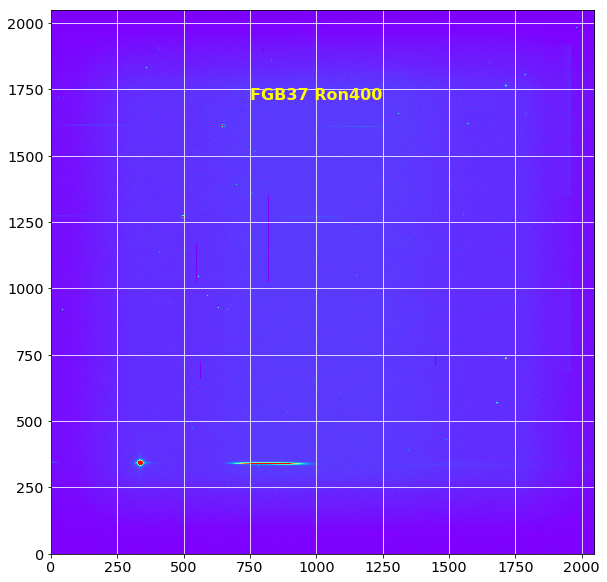

In [15]:
plt.figure(figsize=(10,10))
plt.imshow(all_images[sel_index],origin='lower',cmap='rainbow',vmin=0, vmax=2000)
plt.grid(color='white', ls='solid')
plt.text(1000.,1700,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

### Try to fit a 2D gaussian

- Fit a 2D gaussian on intensity of central star


we have to paly with the parameter below to find a common region to find the central star

In [16]:
# first rough estimate of the maximum
x0,y0=guess_init_fit(all_images[sel_index],250,500,250,500)

In [17]:
dw=200  # width

In [18]:
print "x0,y0=",x0,y0

x0,y0= 335 343


In [19]:
# cut the subimage
cropped_image=np.copy(all_images[sel_index][y0-dw:y0+dw,x0-dw:x0+dw])

In [20]:
NY=cropped_image.shape[0]
NX=cropped_image.shape[1]

In [21]:
# build a mesh grid of x-y
y, x = np.mgrid[:NY,:NX]

In [22]:
z=cropped_image[y,x]

### Show the pre-selected subimage

Text(100,100,'FGB37 Ron400')

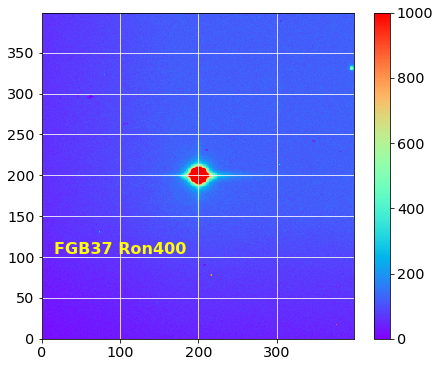

In [23]:
# plot x,y,z
plt.figure(figsize=(7,6))
plt.pcolormesh(x, y, z,cmap='rainbow',vmin=0, vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.text(100.,100,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

In [24]:
x_mean=NX/2
y_mean=NY/2
z_max=z[y_mean,x_mean]
print x_mean,y_mean,z_max

200 200 61035.313713690324


### Make the 2D fit

In [25]:
p_init = models.Gaussian2D(amplitude=z_max,x_mean=x_mean,y_mean=y_mean)
fit_p = fitting.LevMarLSQFitter()

In [26]:
import warnings
p = fit_p(p_init, x, y, z)

In [27]:
print p.x_mean
print p.y_mean
print p.amplitude

Parameter('x_mean', value=200.563958507)
Parameter('y_mean', value=199.79044308)
Parameter('amplitude', value=80000.3718973)


In [28]:
new_x0=p.x_mean
new_y0=p.y_mean

### Show result of 2D gaussian fit

Text(0.5,1,'Residual')

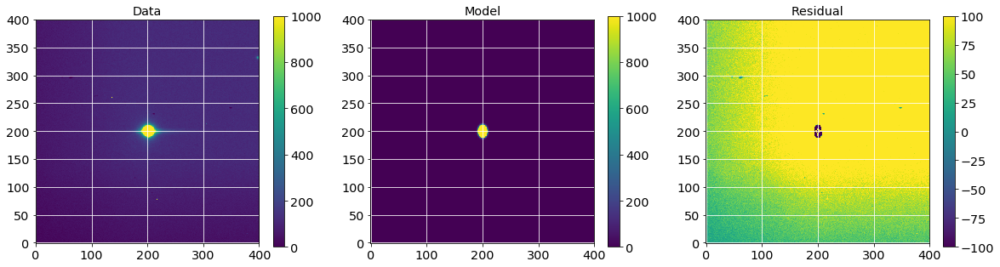

In [29]:
plt.figure(figsize=(20, 5))
#subplot 1
plt.subplot(1, 3, 1)
plt.imshow(z, origin='lower', interpolation='nearest', vmin=0, vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Data")
#subplot 2
plt.subplot(1, 3, 2)
plt.imshow(p(x, y), origin='lower', interpolation='nearest', vmin=0,vmax=1000)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Model")
#subplot 3
plt.subplot(1, 3, 3)
plt.imshow(z - p(x, y), origin='lower', interpolation='nearest', vmin=-100,vmax=100)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.title("Residual")

### Check the result of the fit

- the center of the star is where it is expected (black point)

Text(100,100,'FGB37 Ron400')

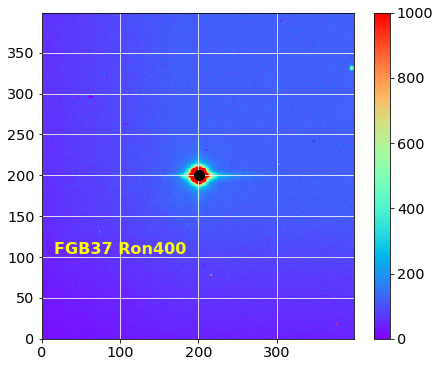

In [30]:
plt.figure(figsize=(7,6))
plt.pcolormesh(x, y, z,cmap='rainbow',vmin=0, vmax=1000)
plt.plot([new_x0],[new_y0],'ko',markersize=10)
plt.grid(color='white', ls='solid')
plt.colorbar()
plt.text(100.,100,all_filt[sel_index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)

## Show the images at Input

- So now work on the series of the images

- First look at them
- notice there is a downsampling factor of 10

Processing image 0...
Processing image 1...
Processing image 2...
Processing image 3...
Processing image 4...
Processing image 5...
Processing image 6...
Processing image 7...
Processing image 8...
Processing image 9...
Processing image 10...


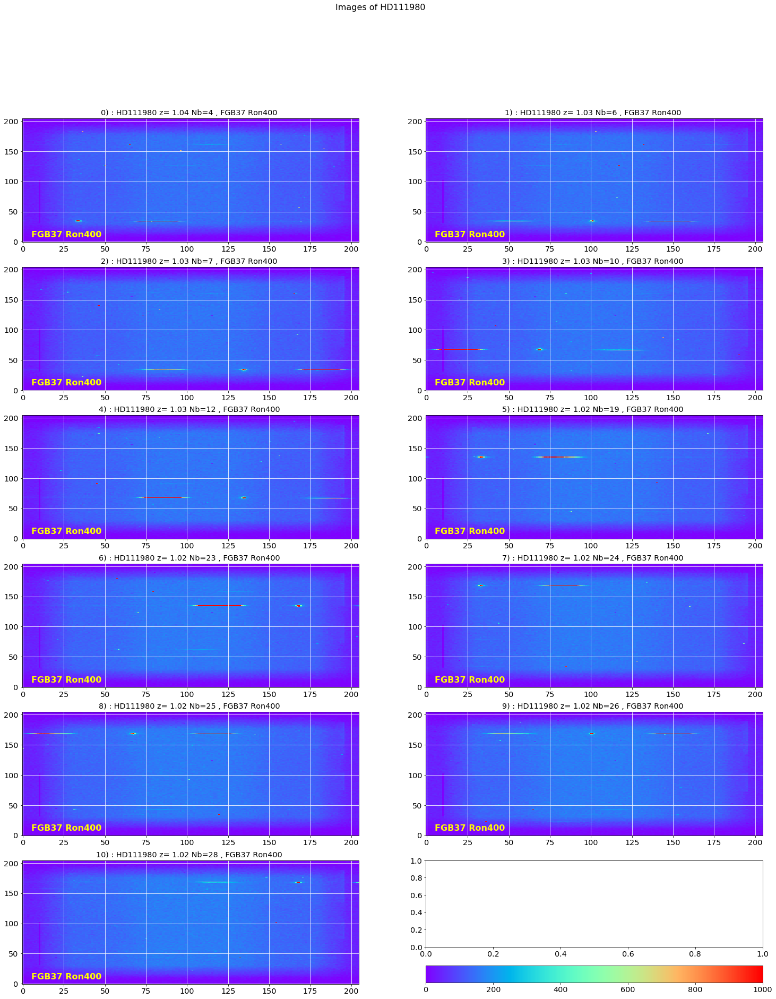

In [31]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,downsampling=10,verbose=True)

figfilename=os.path.join(dir_top_images,'input_images.pdf')
plt.savefig(figfilename)   

## Show the histograms of input images

- just check the reduction and deflattage is OK

Processing image 0...
Processing image 1...
Processing image 2...


/Users/dagoret/anaconda3/envs/py27/lib/python2.7/site-packages/matplotlib/axes/_base.py:3477: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


Processing image 3...
Processing image 4...
Processing image 5...
Processing image 6...
Processing image 7...
Processing image 8...
Processing image 9...
Processing image 10...


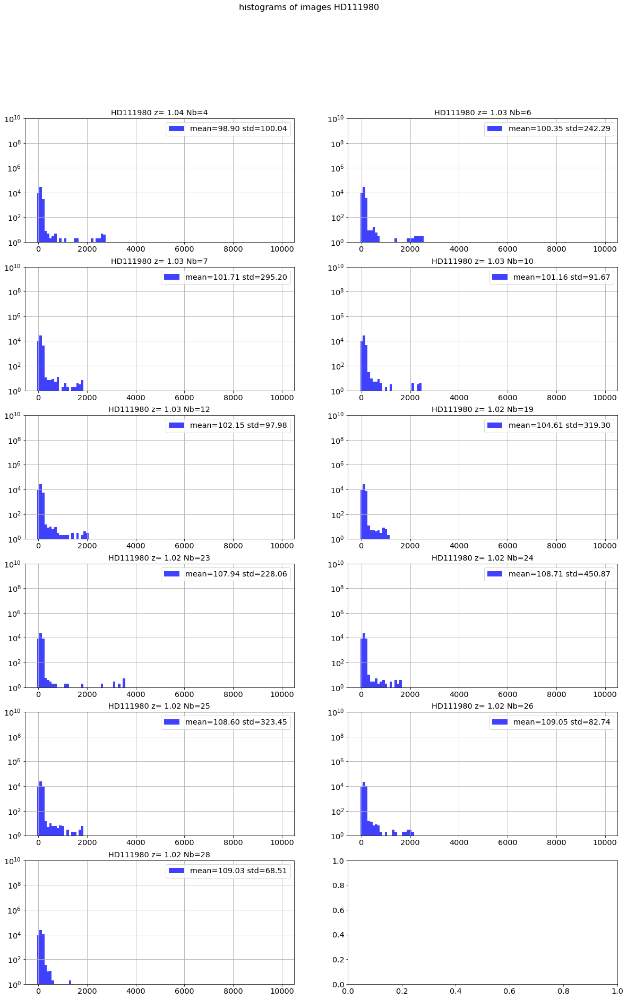

In [32]:
ShowHistograms(all_images,all_titles,all_filt,object_name,
               NBIMGPERROW=2,bins=100,range=(-50,10000),downsampling=10,verbose=True)

##  Guess central position of the central star in original image

- defines two utility functions


### Compute the position of central star

** Please the the area for the central star here **

In [33]:
# guess the region where the maximum is
#Delta_x0=[750,1000]
#Delta_y0=[500,750]
#dwc=125

Delta_x0=[50,1950]
Delta_y0=[50,1950]
dwc=800


x_guess,y_guess=guess_central_position(all_images,Delta_x0,Delta_y0,dwc,filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx)

IndexError: index 0 is out of bounds for axis 0 with size 0

In [34]:
x_guess= np.array([350.,1100.,1350.,700.,1300.,300.,1700.,300.,700.,1000.,1700.])
y_guess=np.array([350.,350.,350.,700.,700.,1400.,1400.,1600.,1700.,1600.,1700.])


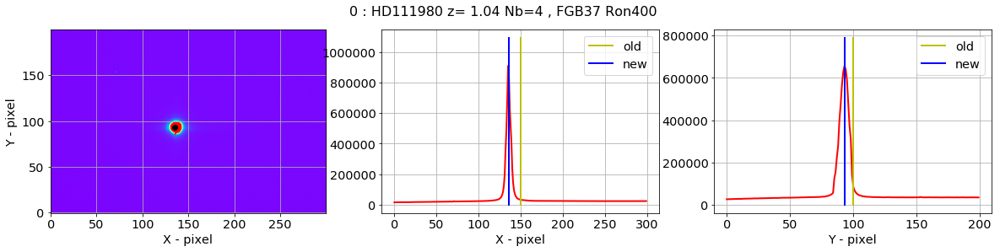

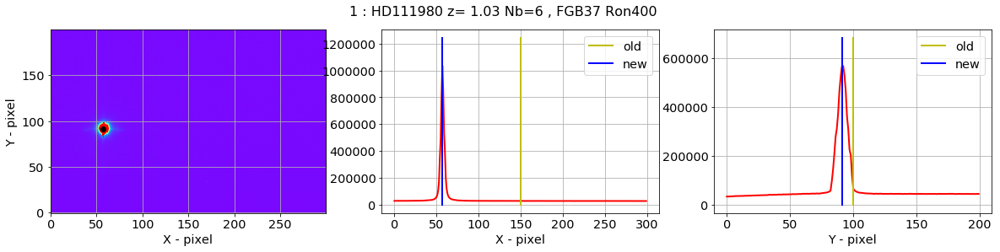

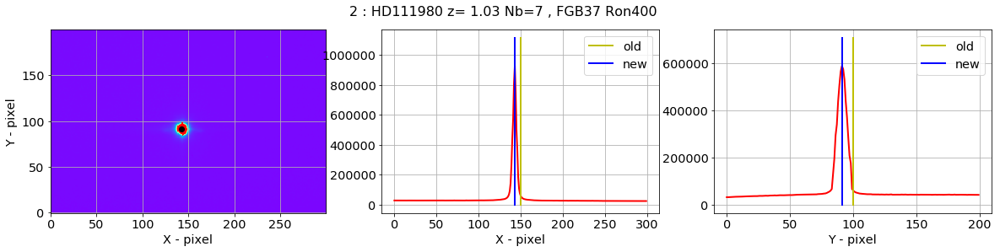

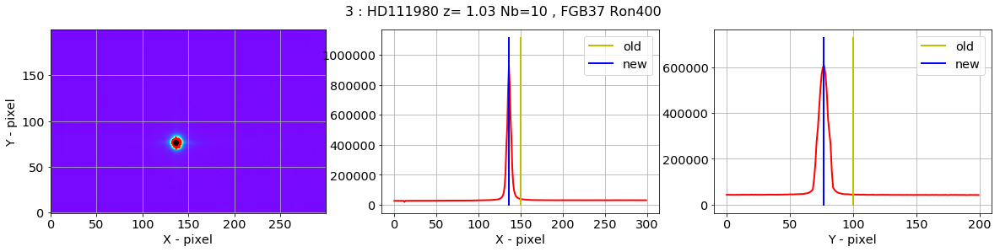

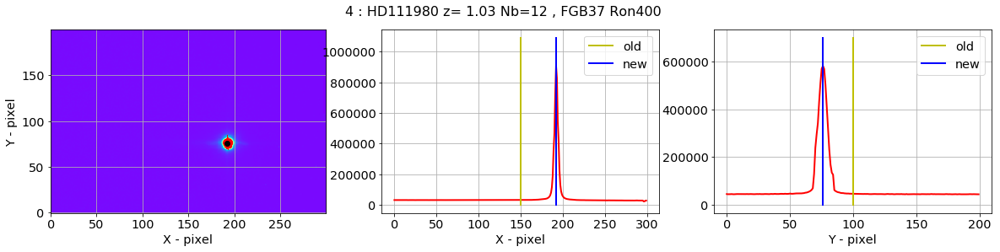

...

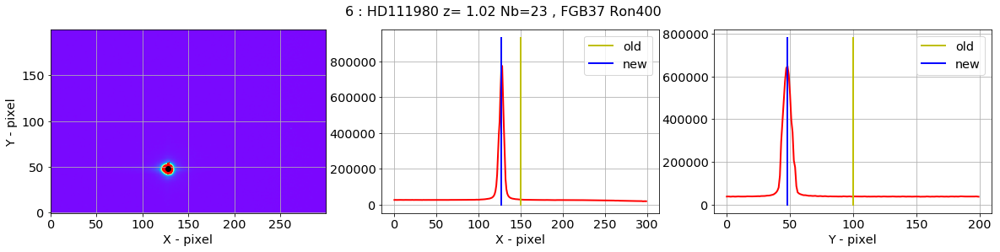

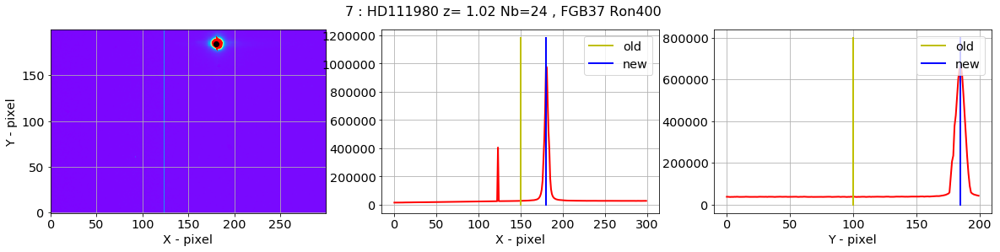

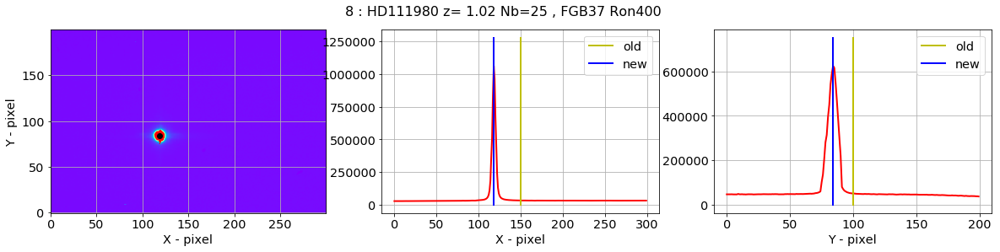

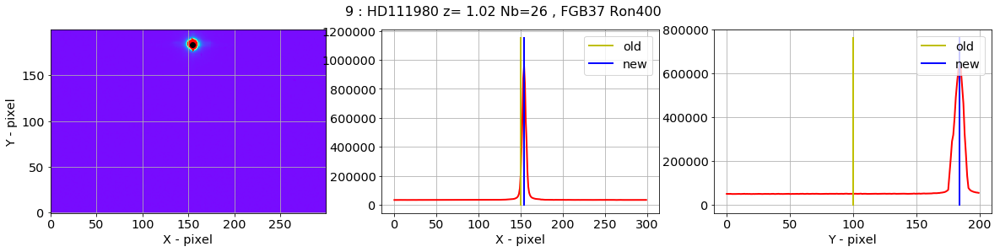

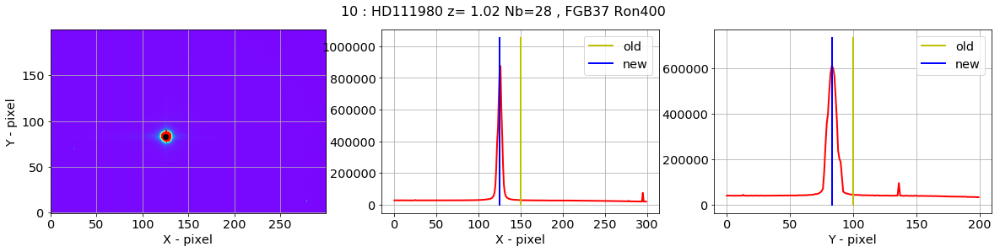

In [35]:
new_x_guess,new_y_guess=check_central_star(all_images,x_guess,y_guess,all_titles,all_filt,Dx=150,Dy=100)

### Check corrections of the center

In [36]:
dx_guess=new_x_guess-x_guess
dy_guess=new_y_guess-y_guess

Text(0.5,0,'dy - pixel')

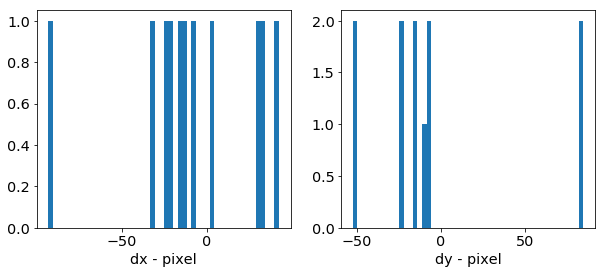

In [37]:
f, (ax1, ax2) = plt.subplots(1,2, figsize=(10,4))
ax1.hist(dx_guess,bins=50);
ax1.set_xlabel("dx - pixel")
ax2.hist(dy_guess,bins=50);
ax2.set_xlabel("dy - pixel")

In [38]:
x_guess=new_x_guess
y_guess=new_y_guess

## Save x_guess, y_guess in a file

In [39]:
ar = {'x_guess' : x_guess, 'y_guess' : y_guess}
df = pd.DataFrame(ar)

In [40]:
df.head()

,x_guess,y_guess
0,335.448097,343.053556
1,1007.084739,341.484256
2,1342.833047,341.122682
3,686.097705,676.418313
4,1342.206613,675.905141


In [41]:
df.tail()

,x_guess,y_guess
6,1677.366949,1347.699481
7,329.970621,1684.451569
8,668.252324,1684.006444
9,1003.964534,1683.614806
10,1675.382556,1683.330604


In [42]:
df.describe()

,x_guess,y_guess
count,11.000000,11.000000
mean,945.536098,1073.678427
std,515.949652,596.903426
min,329.970621,341.122682
25%,501.850210,509.479348
50%,1003.964534,1347.699481
75%,1342.519830,1683.472705
max,1677.366949,1684.451569


In [43]:
df.to_csv('x_y_guess.csv')

## Finally cut image

- before rotation

- cut the image around the spectra
- the width in Y is DeltaY=100 pixel above and down

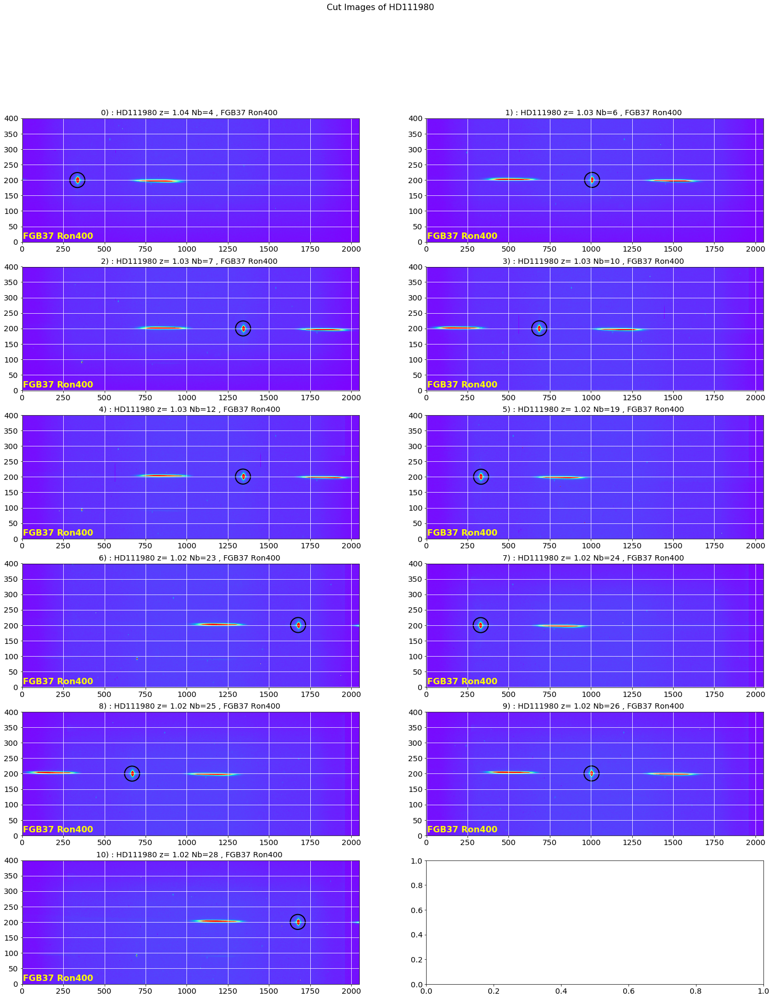

In [44]:
DeltaY=[200]*len(all_images) # put to 200 because background goes far
DeltaX=[2000]*len(all_images)  # must be very large to have correct x positions

images_raw=ShowCenterImages(x_guess,y_guess,DeltaX,DeltaY,all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=2000,target_pos=np.array([x_guess,y_guess]).T)
figfilename=os.path.join(dir_top_images,'cut_images.pdf')
plt.savefig(figfilename)   

## Save cut images
------------------------

- save the series of cut images called **images_raw** in a file


In [45]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^%s_(.*)' % tag,short_infilename)
    short_outfilename='cutimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)
    
for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_raw[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)

!ls -l cut_fitsimages/*

-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_004.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_006.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_007.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_010.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_012.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_019.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_023.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_024.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_025.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_026.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:02 cut_fitsimages/cutimg_20170609_028.fits

---------------------------------------------------------------------------------
# Section 2 : Find the rotation angle and apply rotation
----------------------------------------------------------------------------------

## Initialisation of Section 2
----------------------------------

In [46]:
inputdir="./cut_fitsimages"
SelectTagRe='^cutimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^cutimg_%s_[0-9]+.fits$' % date

outputdir="./rotated_fitsimages"
ensure_dir(outputdir)

sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 

all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 11


In [47]:
filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx=get_filt_idx(all_filt)

In [48]:
df=pd.read_csv('x_y_guess.csv')
x_guess=df["x_guess"]
y_guess=df["y_guess"]
DeltaY=[200]*len(all_images)

In [49]:
df.head()

,Unnamed: 0,x_guess,y_guess
0,0,335.448097,343.053556
1,1,1007.084739,341.484256
2,2,1342.833047,341.122682
3,3,686.097705,676.418313
4,4,1342.206613,675.905141


## Find rotation by Hessian analysis

La méthode s'inspire des techniques de détection de filmanents dans le milieu interstellaire.
Elle est décrite dans https://arxiv.org/pdf/1409.6728.pdf section 4.1.
Documentation sur le calcul du Hessien : http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hessian_matrix

### Test rotation optimal settings

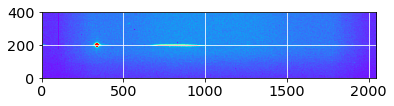

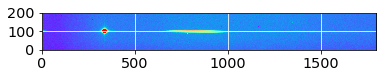

In [50]:
sel=0
image_sel=np.copy(all_images[sel])
y0=DeltaY[sel]
x0=x_guess[sel]

width_cut = 100
right_edge = 1800

plt.imshow(image_sel,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

region=np.copy(image_sel[y0-width_cut:y0+width_cut,0:right_edge])
data=np.copy(region)
plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()

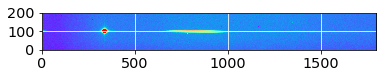

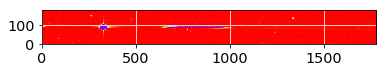

In [51]:
# le paramètre sigma permet de lisser le hessien
Hxx, Hxy, Hyy = hessian_matrix(data, sigma=3, order = 'xy')
lambda_plus = 0.5*( (Hxx+Hyy) + np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
lambda_minus = 0.5*( (Hxx+Hyy) - np.sqrt( (Hxx-Hyy)**2 +4*Hxy*Hxy) )
theta = 0.5*np.arctan2(2*Hxy,Hyy-Hxx)*180/np.pi

margin_cut = 10

lambda_minus = lambda_minus[margin_cut:-margin_cut,margin_cut:-margin_cut]
lambda_plus = lambda_plus[margin_cut:-margin_cut,margin_cut:-margin_cut]
theta = theta[margin_cut:-margin_cut,margin_cut:-margin_cut]

plt.imshow(data,origin='lower',cmap='rainbow',vmin=-10,vmax=800)
plt.grid(color='white', ls='solid')
plt.show()
plt.imshow(lambda_minus,origin='lower',cmap='rainbow',vmin=-10,vmax=0)
plt.grid(color='white', ls='solid')
plt.show()

Number of remaining pixels : 4014


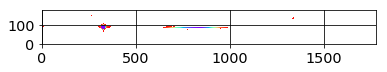

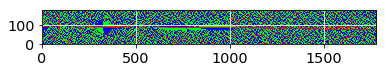

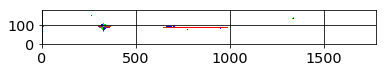

In [52]:
lambda_threshold = -2

mask = np.where(lambda_minus>lambda_threshold)
lambda_mask = np.copy(lambda_minus)
lambda_mask[mask]=np.nan

theta_mask = np.copy(theta)
theta_mask[mask]=np.nan

print 'Number of remaining pixels :',len(lambda_mask[~np.isnan(lambda_mask)])

plt.imshow(lambda_mask,origin='lower',cmap='rainbow',vmin=-100,vmax=0)
plt.grid(color='black', ls='solid')
plt.show()

plt.imshow(theta,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='white', ls='solid')
plt.show()

plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-30,vmax=30)
plt.grid(color='black', ls='solid')
plt.show()

Number of remaining pixels : 2974


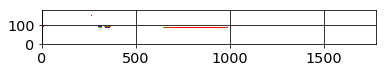

In [53]:
deg_threshold = 20

mask2 = np.where(np.abs(theta)>deg_threshold)
theta_mask[mask2] = np.nan
print 'Number of remaining pixels :',len(theta_mask[~np.isnan(theta_mask)])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.grid(color='black', ls='solid')
plt.show()

Angle median : -0.5122020315071076


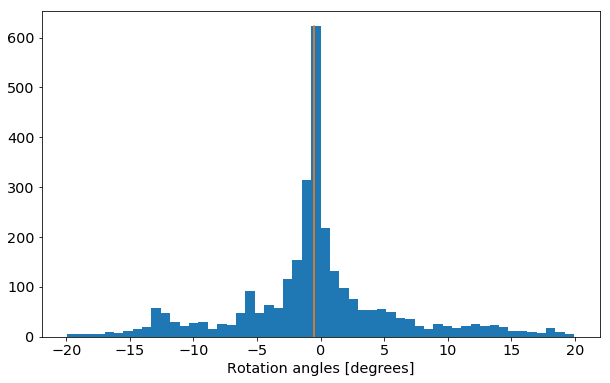

In [54]:
theta_hist = []
theta_hist = theta_mask[~np.isnan(theta_mask)].flatten()
theta_median = np.median(theta_hist)
print 'Angle median :',theta_median
fig = plt.figure(figsize=(10,6))
n,bins, patches = plt.hist(theta_hist,bins=int(np.sqrt(len(theta_hist))))
plt.plot([theta_median,theta_median],[0,np.max(n)])
plt.xlabel("Rotation angles [degrees]")
plt.show()

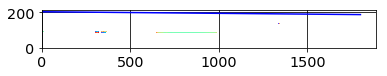

In [55]:
xindex=np.arange(data.shape[1])
x_new = np.linspace(xindex.min(),xindex.max(), 50)
#y_new = y0 - width_cut + (x_new-x0)*np.tan(theta_median*np.pi/180.)
# really want to see of hessian an straight line math SDC : Sept 25 2017
y_new = y0   + (x_new-x0)*np.tan(theta_median*np.pi/180.)
plt.imshow(theta_mask,origin='lower',cmap='rainbow',vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()


Rotation angle from fit : -0.28784473018116324


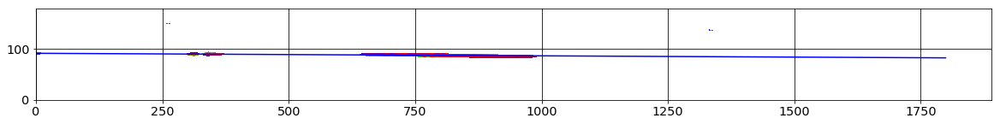

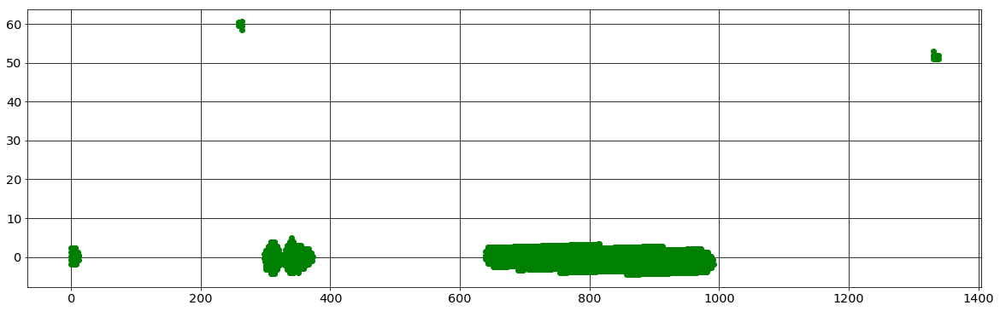

In [56]:
xtofit=[]
ytofit=[]
for iy,y in enumerate(theta_mask):
    for ix,x in enumerate(y):
        if not np.isnan(theta_mask[iy][ix]) :
            if np.abs(theta_mask[iy][ix])>deg_threshold : continue
            xtofit.append(ix)
            ytofit.append(iy)
popt, pcov = fit_line(xtofit, ytofit)
[a, b] = popt
x_new = np.linspace(xindex.min(),xindex.max(), 50)
y_new = line(x_new,a,b)
print 'Rotation angle from fit :',np.arctan(a)*180/np.pi
fig = plt.figure(figsize=[20,6])
plt.imshow(theta_mask,origin='lower',cmap=cm.brg,vmin=-deg_threshold,vmax=deg_threshold)
plt.plot(x_new,y_new,'b-')
plt.grid(color='black', ls='solid')
plt.show()
fig = plt.figure(figsize=[20,6])
diff = []
for ix,x in enumerate(xtofit):
    diff.append(ytofit[ix]-line(x,a,b))
plt.plot(xtofit,diff,'go')
plt.grid(color='black', ls='solid')
plt.show()

Using Hessian theta angles:
0  theta =  -0.51113190420373
1  theta =  -0.339621401673793
2  theta =  -0.11146854024941062
3  theta =  -0.3127945884189896
4  theta =  -0.16584129840297948
5  theta =  -0.3660713329054408
6  theta =  -0.11782729984585702
7  theta =  -0.3874420550265456
8  theta =  -0.2785342049785661
9  theta =  -0.33155707670150225
10  theta =  -0.18678175502376826


Text(0.5,0,'angle (deg)')

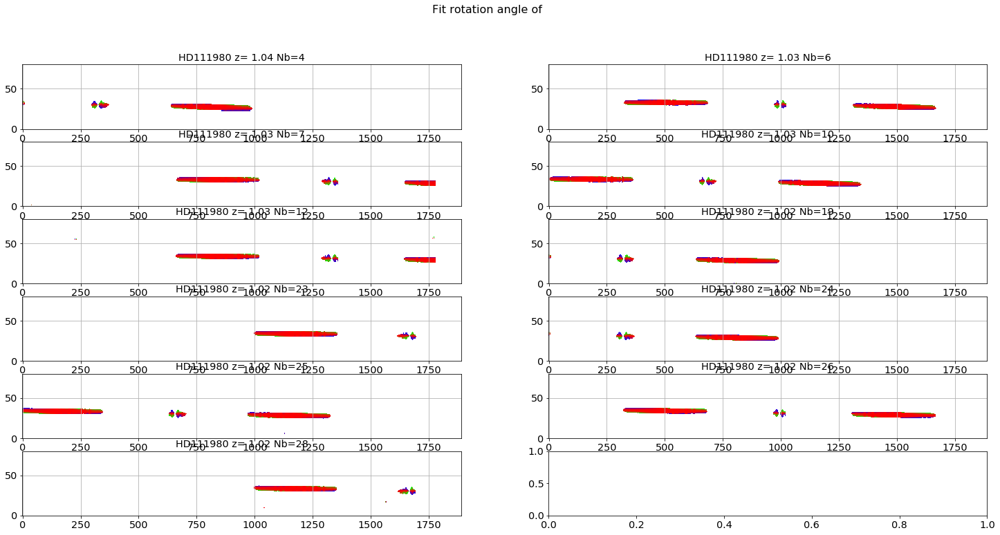

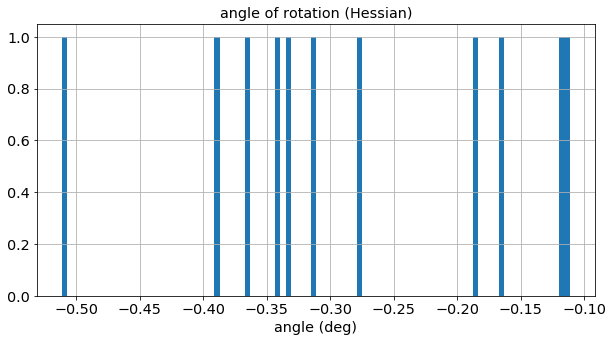

In [57]:
print 'Using Hessian theta angles:'

all_theta=ComputeRotationAngleHessian(all_images,x_guess,DeltaY,all_titles,object_name, 
    NBIMGPERROW=2, lambda_threshold = -2, deg_threshold = 20, width_cut = 40, right_edge = 1800, margin_cut = 10)
figfilename=os.path.join(dir_top_images,'fit_rotation.pdf')
plt.savefig(figfilename)  

for index in range(len(all_theta)):
    print index,' theta = ',all_theta[index]
plt.figure(figsize=(10,5))
n, bins, patches=plt.hist(all_theta,bins=100,histtype='stepfilled')
plt.grid(True)
plt.title('angle of rotation (Hessian)')
plt.xlabel('angle (deg)')

## Turn the images accordingly

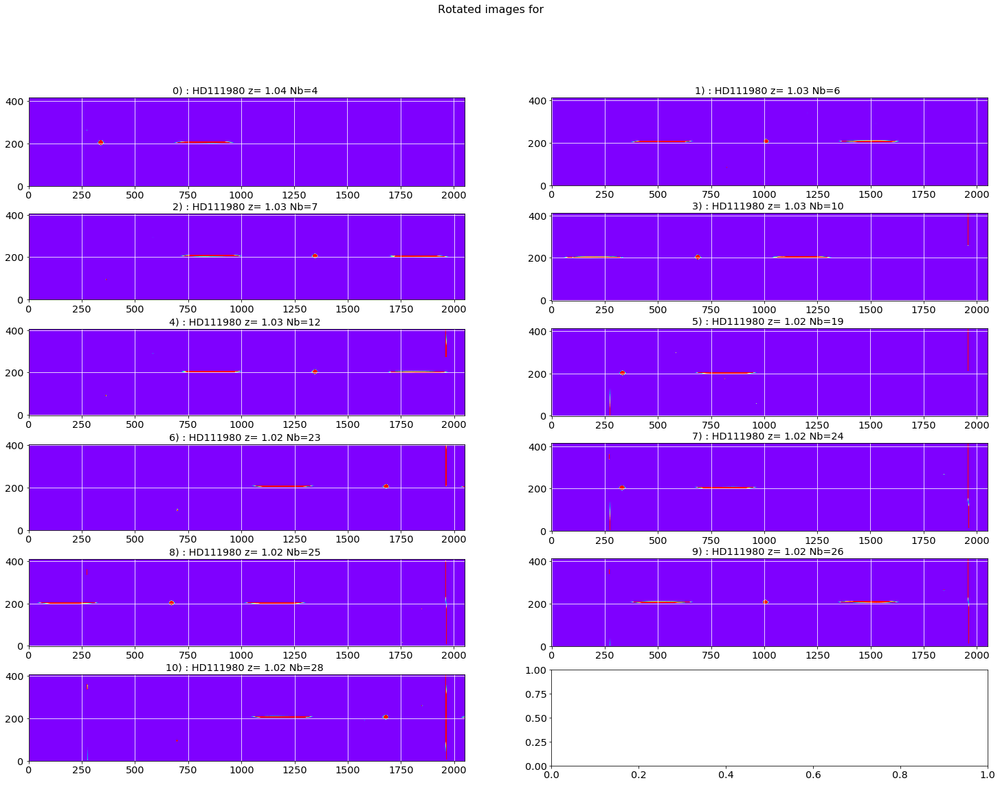

In [58]:
turned_images=TurnTheImages(all_images,all_theta,all_titles,object_name,
                            NBIMGPERROW=2,vmin=500,vmax=1000,oversample_factor=1)
figfilename=os.path.join(dir_top_images,'rotated_images.pdf')
plt.savefig(figfilename)  

## Check rotations

array([ 0.03199469,  0.05254787,  0.03731958,  0.06231197,  0.07086205,
       -0.01052177, -0.07421242, -0.00685577, -0.03152505,  0.05371221,
       -0.00257145])

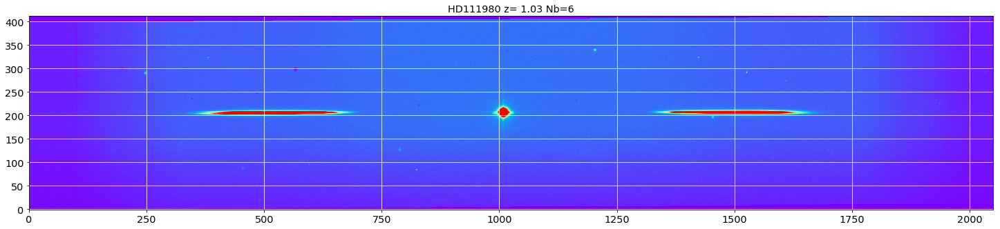

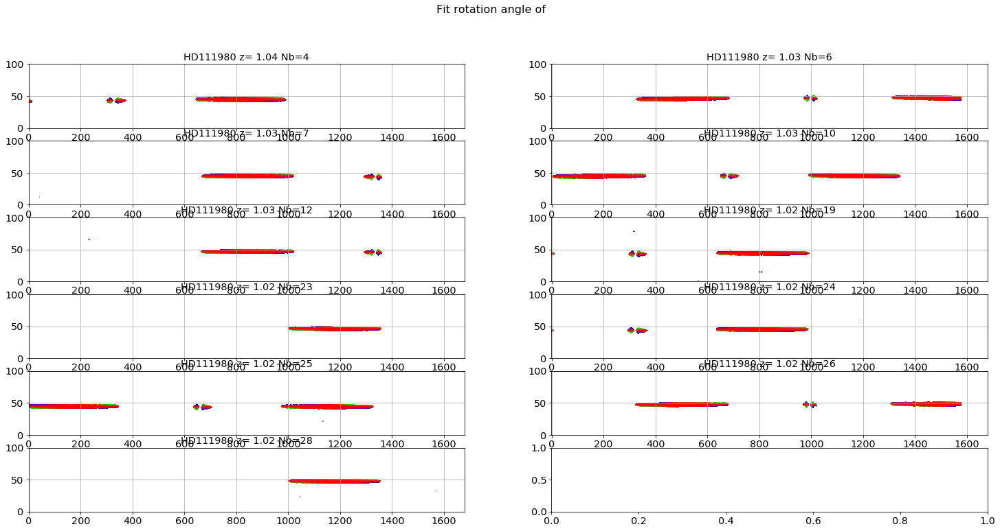

In [59]:
sel=1
plt.figure(figsize=(25,10))
plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
plt.grid(True)
plt.title(all_titles[sel])
plt.grid(color='white', ls='solid')
figfilename=os.path.join(dir_top_images,'rotated_image_sample.pdf')
plt.savefig(figfilename)  

ComputeRotationAngleHessian(turned_images,x_guess,DeltaY,all_titles,object_name,
    NBIMGPERROW=2, lambda_threshold = -2, deg_threshold = 20, width_cut = 50, right_edge = 1600, margin_cut = 10)

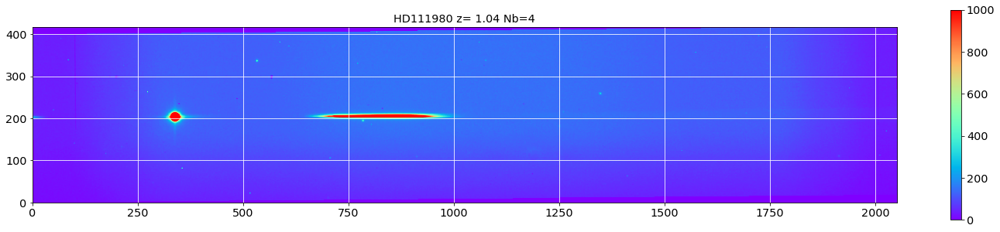

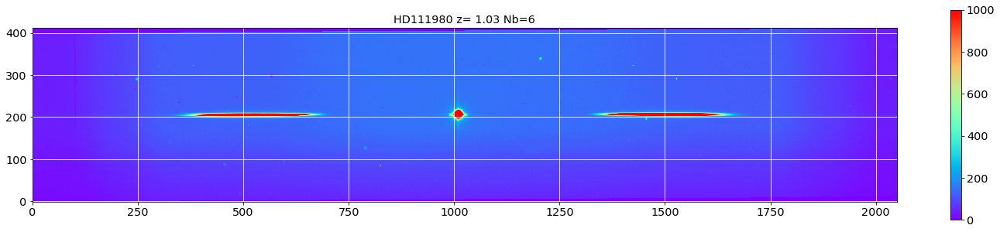

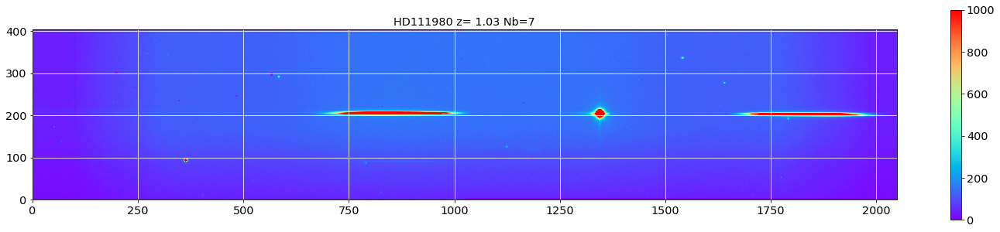

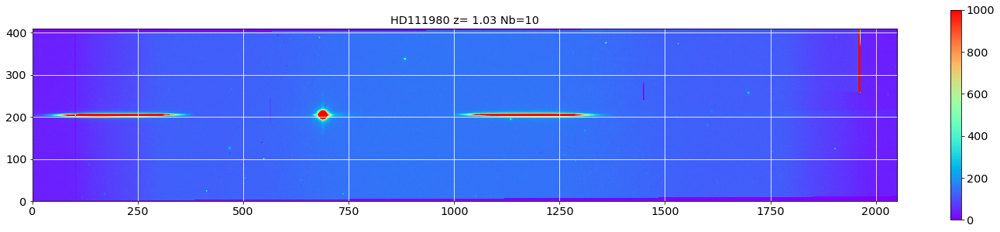

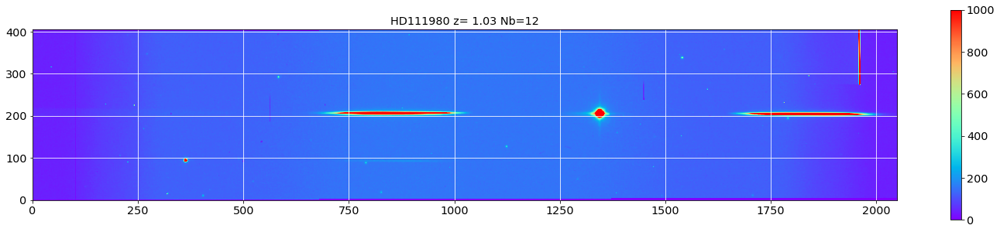

...

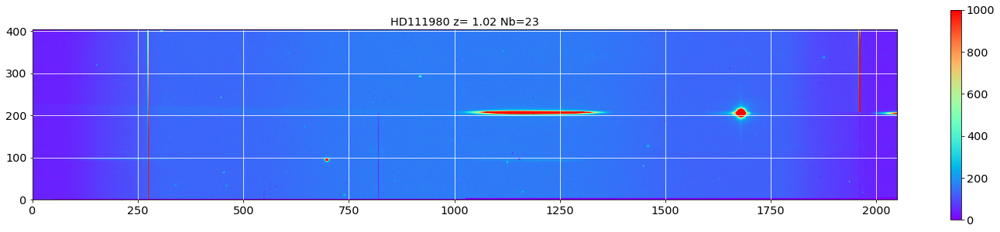

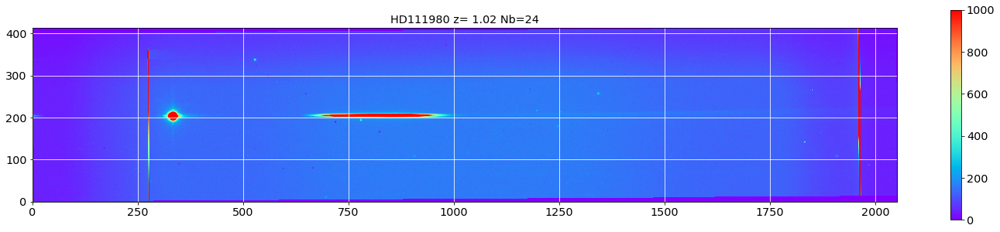

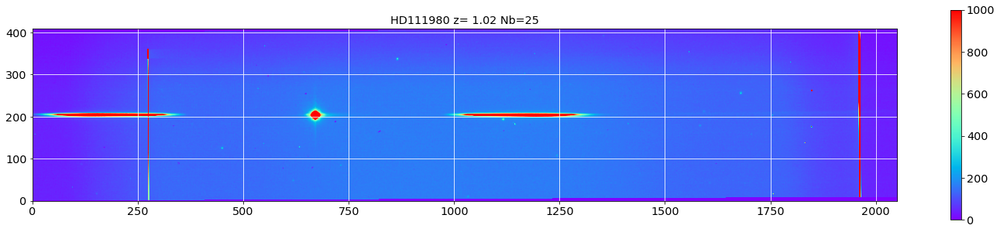

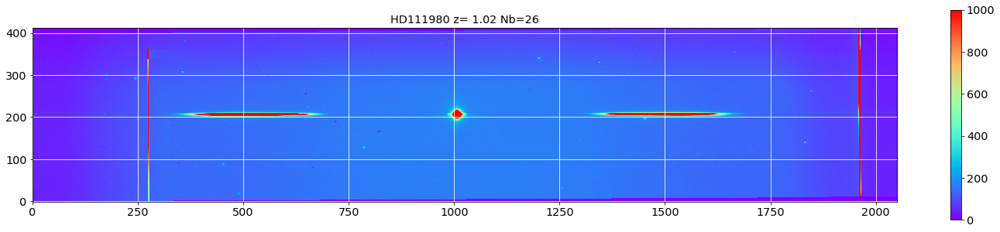

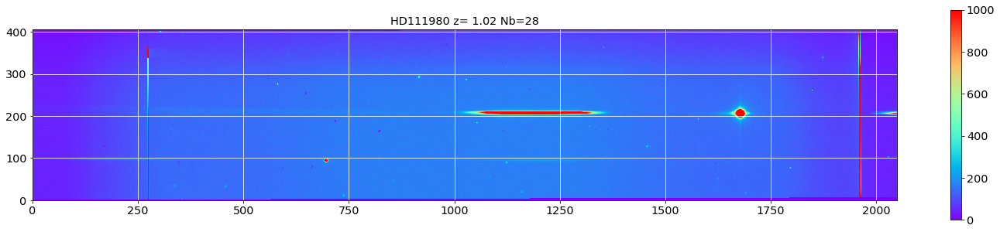

In [60]:
debug=True
if debug:
    for sel in range(len(turned_images)):
        plt.figure(figsize=(25,5))
        plt.imshow(turned_images[sel],origin='lower',cmap='rainbow',vmin=0,vmax=1000)
        plt.grid(True)
        plt.title(all_titles[sel])
        plt.grid(color='white', ls='solid')
        plt.colorbar()

## Must guess again the new centers for rotation

In [61]:
# guess the region where the maximum is
Delta_x02=[280,1750]
#Delta_y02=[50,150]
Delta_y02=[175,225]
dwc2=40

In [62]:
turned_images[0].shape

(418, 2051)

In [63]:
guess_init_fit(turned_images[0],Delta_x02[0],Delta_x02[1],Delta_y02[0],Delta_y02[1])

(337, 204)

### Initial guess

In [64]:
x_guess2,y_guess2=guess_central_position(turned_images,Delta_x02,Delta_y02,dwc2,filt0_idx,filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx,filt6_idx)

0 : (x_guess,y_guess)= 337.0922311175572 202.65606061079856
1 : (x_guess,y_guess)= 1008.0888797771572 206.1986906478025
2 : (x_guess,y_guess)= 1343.2567253122895 202.72836207521823
3 : (x_guess,y_guess)= 687.099207793522 203.99528240903481
4 : (x_guess,y_guess)= 1342.6835414382856 204.74887821179826
5 : (x_guess,y_guess)= 334.3134419540373 202.34353244347625
6 : (x_guess,y_guess)= 1677.6100857007857 204.13579371744518
7 : (x_guess,y_guess)= 332.1501158288795 202.64513333000855
8 : (x_guess,y_guess)= 669.2473211453416 202.94484434661422
9 : (x_guess,y_guess)= 1005.0102376478642 206.28439852370684
10 : (x_guess,y_guess)= 1675.6669717626 205.95809332274393


### Check new guess of turned images

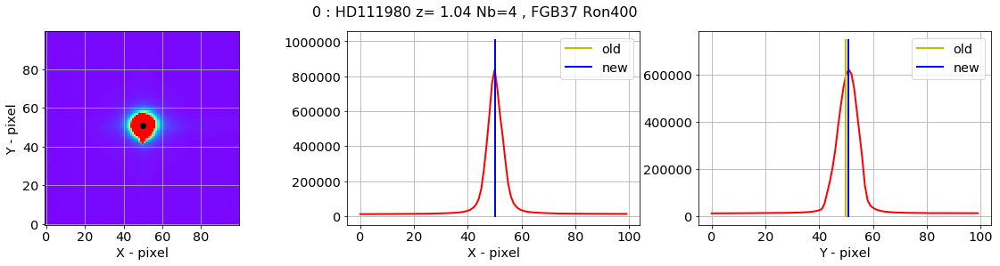

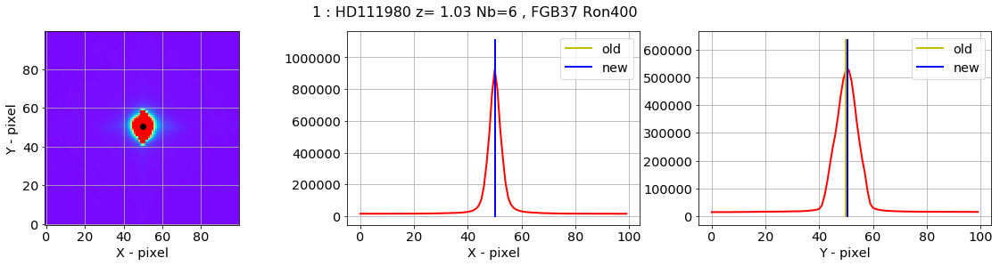

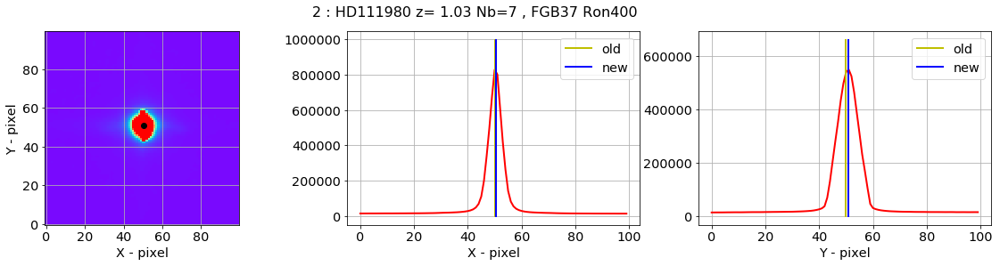

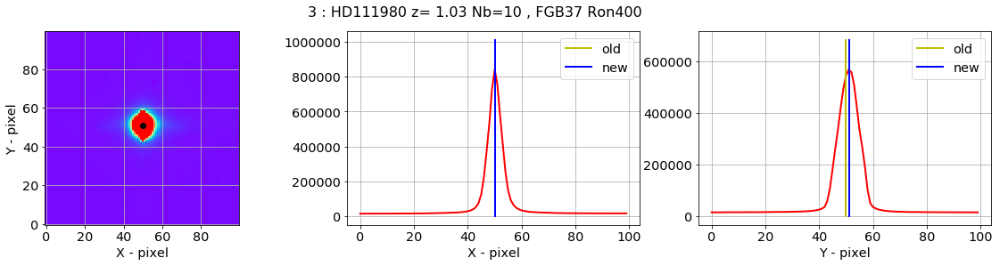

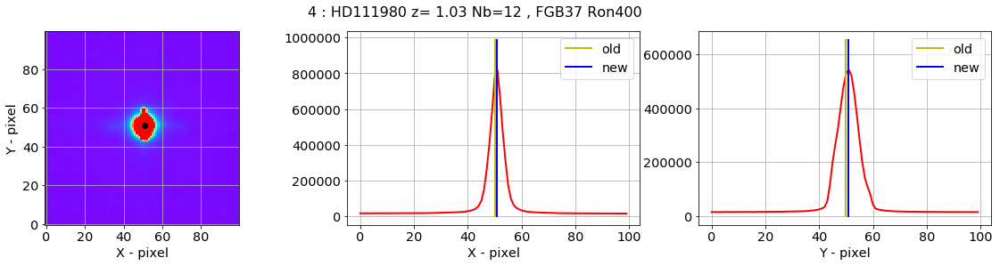

...

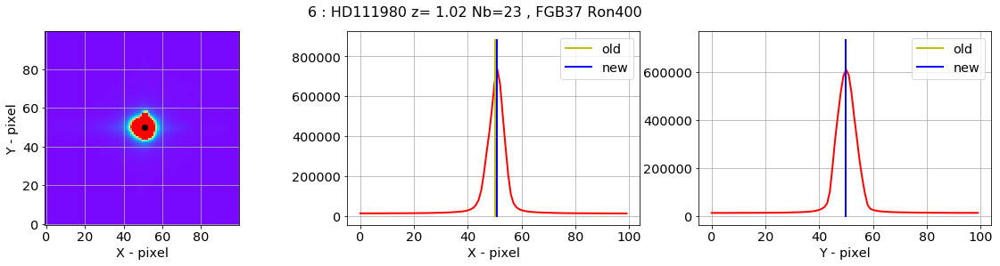

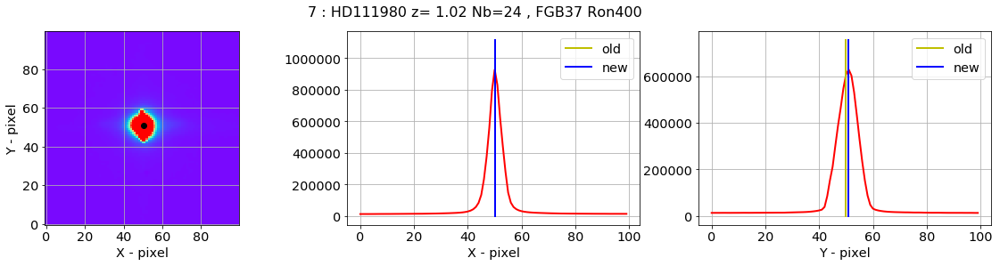

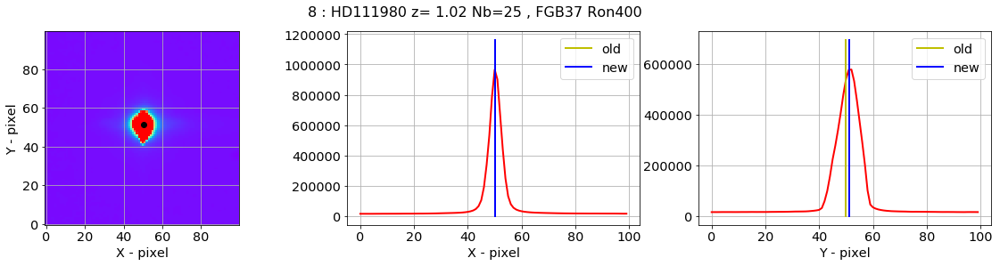

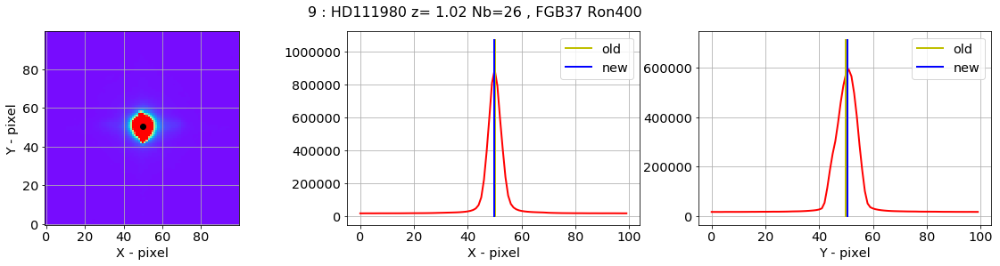

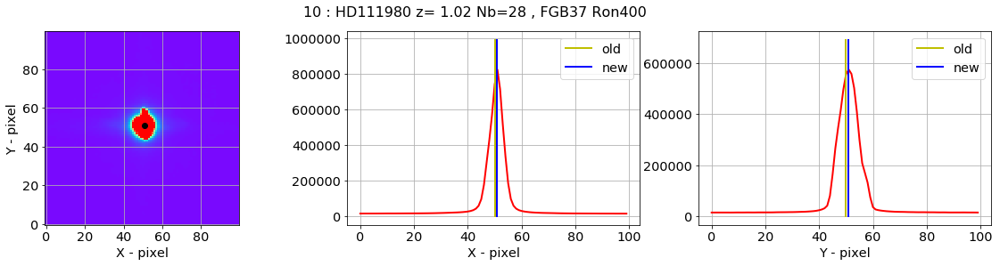

In [65]:
new_x_guess2,new_y_guess2=check_central_star(turned_images,x_guess2,y_guess2,all_titles,all_filt,Dx=50,Dy=50)

In [66]:
x_guess2=new_x_guess2
y_guess2=new_y_guess2

In [67]:
ar2 = {'x_guess2' :x_guess2, 'y_guess2' : y_guess2,'theta' :all_theta}
df2 = pd.DataFrame(ar2)

In [68]:
df2.head()

,theta,x_guess2,y_guess2
0,-0.511132,337.007717,202.901654
1,-0.339621,1008.079892,206.362513
2,-0.111469,1343.318725,202.724297
3,-0.312795,687.103588,204.049248
4,-0.165841,1342.702111,204.796056


In [69]:
df2.to_csv('x_y_guess2.csv')

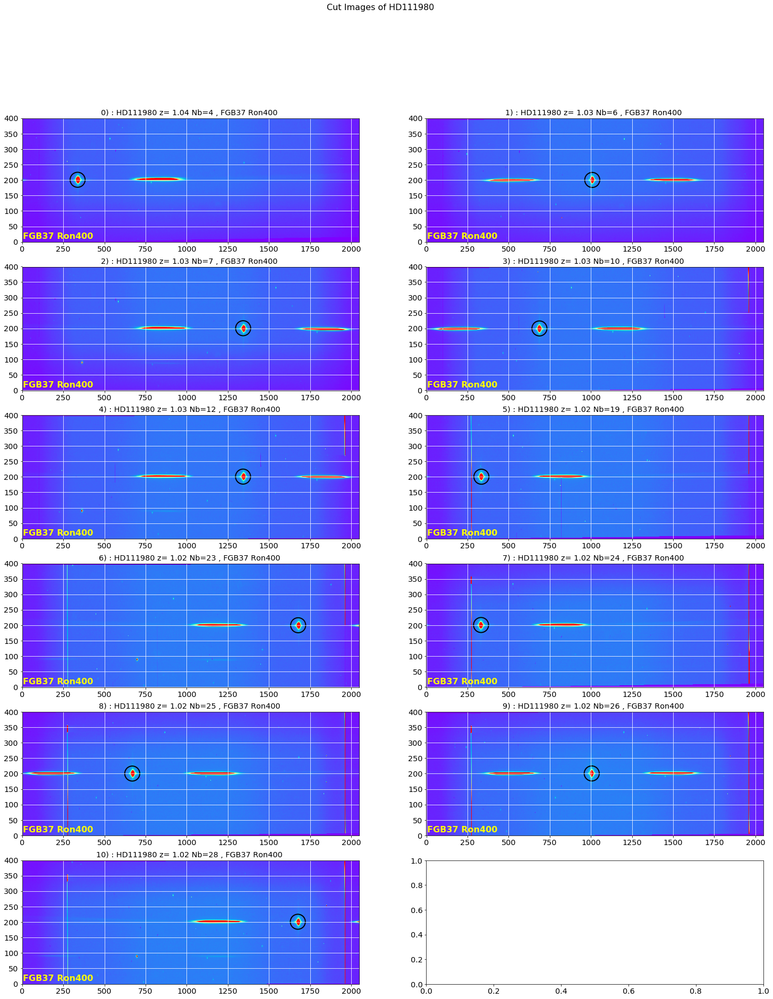

In [70]:
DeltaX=[2000]*len(all_images)
DeltaY_rot2 = [200]*len(all_images) # change from 20 to 50 to see well the central star
x_guess_rot2 = x_guess2
y_guess_rot2 = y_guess2
images_cut_rot=ShowCenterImages(x_guess_rot2,y_guess_rot2,DeltaX,DeltaY_rot2,
                    turned_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=1000,target_pos=np.array([x_guess2,y_guess2]).T) 

## Find the central star locations
======================================

### Central star positions after rotation and cut

In [71]:
# Not necessary to do this because already done
CompareBeforeAfterRotFlag=False

if CompareBeforeAfterRotFlag:

    x_guess_rot = x_guess2
    y_guess_rot = y_guess2
    DeltaY_rot = [200]*len(all_images)
    DeltaX_rot = [200]*len(all_images)
    # First stage : show the rotated images which were cut
    print 'First stage : show the rotated images which were cut'
    #--------------------------------------------------------------
    images_cut=ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,
                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000,target_pos=np.array([x_guess2,y_guess2]).T) 
    # Second stage : show the images cut before they were cut
    print 'Second stage : show the images cut before they were cut'
    #----------------------------------------------------------------
    images_cut_before_rot=ShowCenterImages(x_guess,[100]*len(all_images),DeltaX_rot,DeltaY_rot,
                    all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000,target_pos=np.array([x_guess,y_guess]).T) 

In [72]:
# DAOFind does not work for me (never)
DAOFindUseFlag=False
    
# (JN) valeurs optimisées pour cette étude
if DAOFindUseFlag:
    img_mean,img_median,img_std,img_sources=ComputeStatImages(images_cut,fwhm=10,threshold=10,sigma=5.0,iters=5)
    print 'total number of images',len(images_cut)
    print 'number of centroid found ',len(img_sources)

## Central star position

- should take the brightest

In [73]:
if DAOFindUseFlag:
    x_star = []
    y_star = []
    for index,s in enumerate(img_sources):
        for ss in s:
            x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
            y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
    x_mean = np.mean(x_star)
    y_mean = np.mean(y_star)
    img_size=all_images[0].shape
    plt.figure(figsize=(5,5))

    # plot individual image center
    plt.plot(x_star,y_star,'o')
    # plot the average postion
    plt.plot(x_mean,y_mean,'ro')
    plt.xlim(0,img_size[1])
    plt.ylim(0,img_size[0])
    plt.grid(True)
    
    print 'nuber of x_star = ',len(x_star)
    print 'nuber of y_star = ',len(y_star)

> The problem is that DAOFIND may not find a center for each source. Thys the only solution
is to do the same thing : computing the average depending on each filter.

In [74]:
if DAOFindUseFlag:
    x_star = []
    y_star = []

    x_star_f0 = []
    y_star_f0 = []

    x_star_f1 = []
    y_star_f1 = []

    x_star_f2 = []
    y_star_f2 = []

    x_star_f3 = []
    y_star_f3 = []

    x_star_f4 = []
    y_star_f4 = []

    missing_centroid = []
    missing_centroid_f0 = []
    missing_centroid_f1 = []
    missing_centroid_f2 = []
    missing_centroid_f3 = []
    missing_centroid_f4 = []


    # loop on all image- source
    for index,s in enumerate(img_sources):
        print "star number :",index
        if len(s) == 0:
            print '!! found no centroid'
            missing_centroid.append(index)
        
            if index in filt0_idx:
                missing_centroid_f0.append(index)
        
            if index in filt1_idx:
                missing_centroid_f1.append(index)
            
            if index in filt2_idx:
                missing_centroid_f2.append(index)   
            
            if index in filt3_idx:
                missing_centroid_f3.append(index)     

            if index in filt4_idx:
                missing_centroid_f4.append(index) 
            
        else:
            print 'found ',len(s),' centroid '
            # loop on individual sources in the image
            for ss in s:
                x_star.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                y_star.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
            
                if index in filt0_idx:
                    x_star_f0.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f0.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
        
                if index in filt1_idx:
                    x_star_f1.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f1.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
            
                if index in filt2_idx:
                    x_star_f2.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f2.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])
                
                if index in filt3_idx:
                    x_star_f3.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f3.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])            

                if index in filt4_idx:
                    x_star_f4.append(ss['xcentroid']+x_guess_rot[index]-DeltaX_rot[index])
                    y_star_f4.append(ss['ycentroid']+y_guess_rot[index]-DeltaY_rot[index])        
        
    x_mean = np.mean(x_star)
    y_mean = np.mean(y_star)

    x0_mean = np.mean(x_star_f0)
    y0_mean = np.mean(y_star_f0)



    x1_mean = np.mean(x_star_f1)
    y1_mean = np.mean(y_star_f1)

    x2_mean = np.mean(x_star_f2)
    y2_mean = np.mean(y_star_f2)

    x3_mean = np.mean(x_star_f3)
    y3_mean = np.mean(y_star_f3)

    x4_mean = np.mean(x_star_f4)
    y4_mean = np.mean(y_star_f4)

    print 'SUMMARY ::'
    print '=========='

    print '\t - Found ', len(x_star_f0), ' for filters ',filt_names[0]
    print '\t - Found ', len(x_star_f1), ' for filters ',filt_names[1]
    print '\t - Found ', len(x_star_f2), ' for filters ',filt_names[2]
    print '\t - Found ', len(x_star_f3), ' for filters ',filt_names[3]
    print '\t - Found ', len(x_star_f4), ' for filters ',filt_names[4]

    print '\t - Missing centroids for indexes', missing_centroid
    print '\t - Missing centroids for filter ',filt_names[0], ' : idx = ',missing_centroid_f0
    print '\t - Missing centroids for filter ',filt_names[1], ' : idx = ',missing_centroid_f1
    print '\t - Missing centroids for filter ',filt_names[2], ' : idx = ',missing_centroid_f2
    print '\t - Missing centroids for filter ',filt_names[3], ' : idx = ',missing_centroid_f3
    print '\t - Missing centroids for filter ',filt_names[4], ' : idx = ',missing_centroid_f4

    img_size=all_images[0].shape
    plt.figure(figsize=(15,5))

    # plot individual image center

    # plot the average postion
    plt.plot(x_mean,y_mean,'ro',label='average position')




    plt.plot(x_star_f1,y_star_f1,marker='o',color='lightgreen',label=filt_names[0],lw=0)
    plt.plot(x_star_f2,y_star_f2,marker='o',color='cyan',label=filt_names[1],lw=0)
    plt.plot(x_star_f3,y_star_f3,marker='o',color='orange',label=filt_names[2],lw=0)
    plt.plot(x_star_f4,y_star_f4,marker='o',color='yellow',label=filt_names[3],lw=0)
    plt.plot(x_star_f4,y_star_f0,marker='o',color='magenta',label=filt_names[0],lw=0)

    plt.plot(x_star,y_star,'k+')

    plt.xlim(0,img_size[1])
    #plt.ylim(0,img_size[0])
    plt.ylim(0,200)
    plt.grid(True)
    plt.legend()

### Given DAOFind can find 0 center or more than one, I prefer my guess with a gaussian fit

In [75]:
# Not done because my initial guess is much better
#tmp = ShowCenterImages(x_star,y_star,DeltaX_rot,DeltaY_rot,
#                    images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=20000) 

In [76]:
if DAOFindUseFlag:
    tmp = ShowCenterImages(x_guess_rot,y_guess_rot,DeltaX_rot,DeltaY_rot,images_cut_rot,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=20000) 

### Zero order positions before rotations

In [77]:
if DAOFindUseFlag:
    DeltaY_rot = [50]*len(all_images)
    DeltaX_rot = [50]*len(all_images)
    y_guess2 = DeltaY
    images_raw_cut=ShowCenterImages(x_guess,y_guess2,DeltaX_rot,DeltaY_rot,
                    images_raw,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000) 

In [78]:
# (JN) valeurs optimisées pour cette étude
if DAOFindUseFlag:
    img_mean,img_median,img_std,img_sources=ComputeStatImages(images_raw_cut,fwhm=7,threshold=10,sigma=10.0,iters=5)

###  Finally the guess in the Section 1 was very good

- Take the determination of original position from section 1 
- Do not use DAOFind peak selection used for Photometry

[[ 335.44809668  343.05355629]
 [1007.08473852  341.48425631]
 [1342.83304709  341.12268238]
 [ 686.09770501  676.41831267]
 [1342.20661316  675.90514058]
 [ 332.28988879 1349.37584122]
 [1677.36694889 1347.69948129]
 [ 329.97062138 1684.45156907]
 [ 668.25232379 1684.00644416]
 [1003.96453364 1683.61480599]
 [1675.38255612 1683.33060389]]


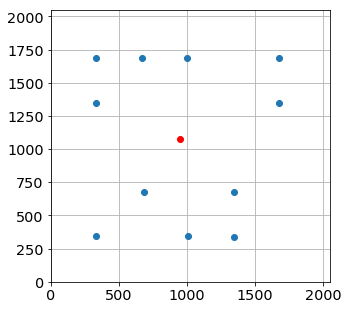

In [79]:
x_pointing = []
y_pointing = []
#for index,s in enumerate(img_sources):
for index in np.arange(len(all_images)):    
    #for ss in s:
    #    x_pointing.append(ss['xcentroid']+x_guess[index]-DeltaX_rot[index])
    #    y_pointing.append(ss['ycentroid']+y_guess[index]-DeltaY_rot[index])
    x_pointing.append(x_guess[index])
    y_pointing.append(y_guess[index])
    
        
x_mean = np.mean(x_pointing)
y_mean = np.mean(y_pointing)
img_size=all_images[0].shape
order0_positions = np.array([x_pointing,y_pointing]).T
print order0_positions

plt.figure(figsize=(5,5))
plt.plot(order0_positions.T[0],order0_positions.T[1],'o')
plt.plot(x_mean,y_mean,'ro')
plt.xlim(0,IMSIZE)
plt.ylim(0,IMSIZE)
plt.grid(True)

#####  cherche le nom de l'hologramme

In [80]:
print all_filt

['FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400', 'FGB37 Ron400']


In [81]:
all_grat = []
for f in all_filt2 :
    #all_grat.append(f.replace('RG715 ',''))
    #all_grat.append(f.replace('dia ',''))
    all_grat.append(f)
for index,g in enumerate(all_grat):
    holo = Hologram(g,verbose=False)
    print g,holo.theta(order0_positions[index]), all_theta[index]

Ron400 -0.277 -0.51113190420373
Ron400 -0.277 -0.339621401673793
Ron400 -0.277 -0.11146854024941062
Ron400 -0.277 -0.3127945884189896
Ron400 -0.277 -0.16584129840297948
Ron400 -0.277 -0.3660713329054408
Ron400 -0.277 -0.11782729984585702
Ron400 -0.277 -0.3874420550265456
Ron400 -0.277 -0.2785342049785661
Ron400 -0.277 -0.33155707670150225
Ron400 -0.277 -0.18678175502376826


## Save results on rotated images

- Save the cut images after rotation
- Save also info on the position

In [82]:
newfullfilenames=[]
for idx,f in np.ndenumerate(sorted_files):
    short_infilename=f.split("/")[-1]
    short_partfilename=re.findall('^cutimg_(.*)',short_infilename)
    short_outfilename='rotimg_'+short_partfilename[0]
    newfullfilename=os.path.join(outputdir,short_outfilename)
    newfullfilenames.append(newfullfilename)

for idx,f in np.ndenumerate(newfullfilenames):
    prihdu = fits.PrimaryHDU(header=all_header[idx[0]],data=images_cut_rot[idx[0]])
    thdulist = fits.HDUList(prihdu)
    thdulist.writeto(f,overwrite=True)
textfilename=os.path.join(outputdir,'star_centroids.txt')
print textfilename
np.savetxt(textfilename,order0_positions,header="y_star x_star",fmt='%d')

!ls -l rotated_fitsimages

./rotated_fitsimages/star_centroids.txt
total 141160
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_004.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_006.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_007.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_010.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_012.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_019.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_023.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_024.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_025.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_026.fits
-rw-r--r--  1 dagoret  staff  6566400 Apr 29 13:03 rotimg_20170609_028.fits
-rw-r--r--  1 dagoret  staff      116 Apr 29 13:03 star_centroids.txt


In [83]:
ar3 = {'x_pointing' :x_pointing, 'y_pointing' : y_pointing,'theta' :all_theta}
df3 = pd.DataFrame(ar3)

In [84]:
df3.to_csv('xy_pointing.csv')

In [85]:
df3

,theta,x_pointing,y_pointing
0,-0.511132,335.448097,343.053556
1,-0.339621,1007.084739,341.484256
2,-0.111469,1342.833047,341.122682
3,-0.312795,686.097705,676.418313
4,-0.165841,1342.206613,675.905141
5,-0.366071,332.289889,1349.375841
6,-0.117827,1677.366949,1347.699481
7,-0.387442,329.970621,1684.451569
8,-0.278534,668.252324,1684.006444
9,-0.331557,1003.964534,1683.614806


## End of Section 2 on rotation

- The following section will be removed.

- At this stage it is recommended to go to **Ana2DShapeSpectra** notebook

-------------------------------------------------------
# Section 3 : Extract spectra
---------------------------------------------------------

## Initialisation of Section 3

In [86]:
outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

inputdir="./rotated_fitsimages"
SelectTagRe='^rotimg_%s_([0-9]+).fits$' % date # regular expression to select the file
SearchTagRe='^rotimg_%s_[0-9]+.fits$' % date

### Get coordinate of order zero before rotation

In [87]:
df=pd.read_csv('xy_pointing.csv')

In [88]:
df.head()

,Unnamed: 0,theta,x_pointing,y_pointing
0,0,-0.511132,335.448097,343.053556
1,1,-0.339621,1007.084739,341.484256
2,2,-0.111469,1342.833047,341.122682
3,3,-0.312795,686.097705,676.418313
4,4,-0.165841,1342.206613,675.905141


In [89]:
x_star=df["x_pointing"]
y_star=df["y_pointing"]

### Get coordinate of order zero after cut and rotation (in file)

In [90]:
df2=pd.read_csv('x_y_guess2.csv')

In [91]:
df2.head()

,Unnamed: 0,theta,x_guess2,y_guess2
0,0,-0.511132,337.007717,202.901654
1,1,-0.339621,1008.079892,206.362513
2,2,-0.111469,1343.318725,202.724297
3,3,-0.312795,687.103588,204.049248
4,4,-0.165841,1342.702111,204.796056


In [92]:
x_star2=df2["x_guess2"]
y_star2=df2["y_guess2"]

In [93]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt,all_filt1,all_filt2=BuildImages(sorted_files,sorted_numbers,object_name)
print 'Number of images:',len(all_images)

Number of images: 11


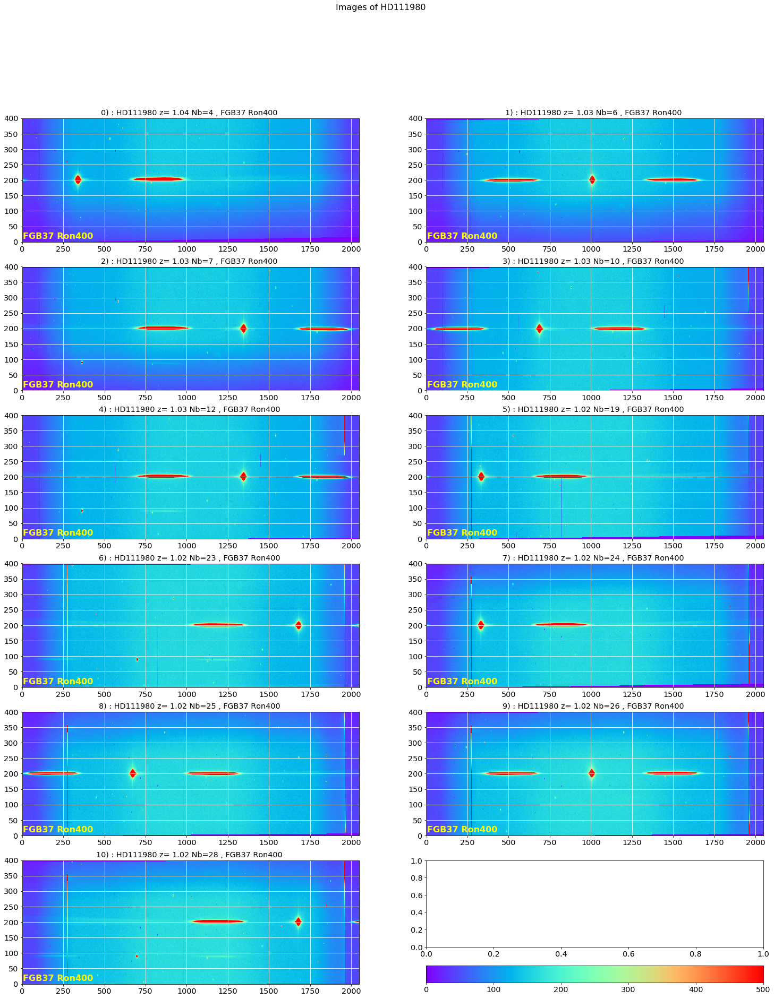

In [94]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=500)

## Extraction of the spectrum from the 2D - Images


### Check the transverse spectrum does not show multi-bum

This proves the rotation may be OK

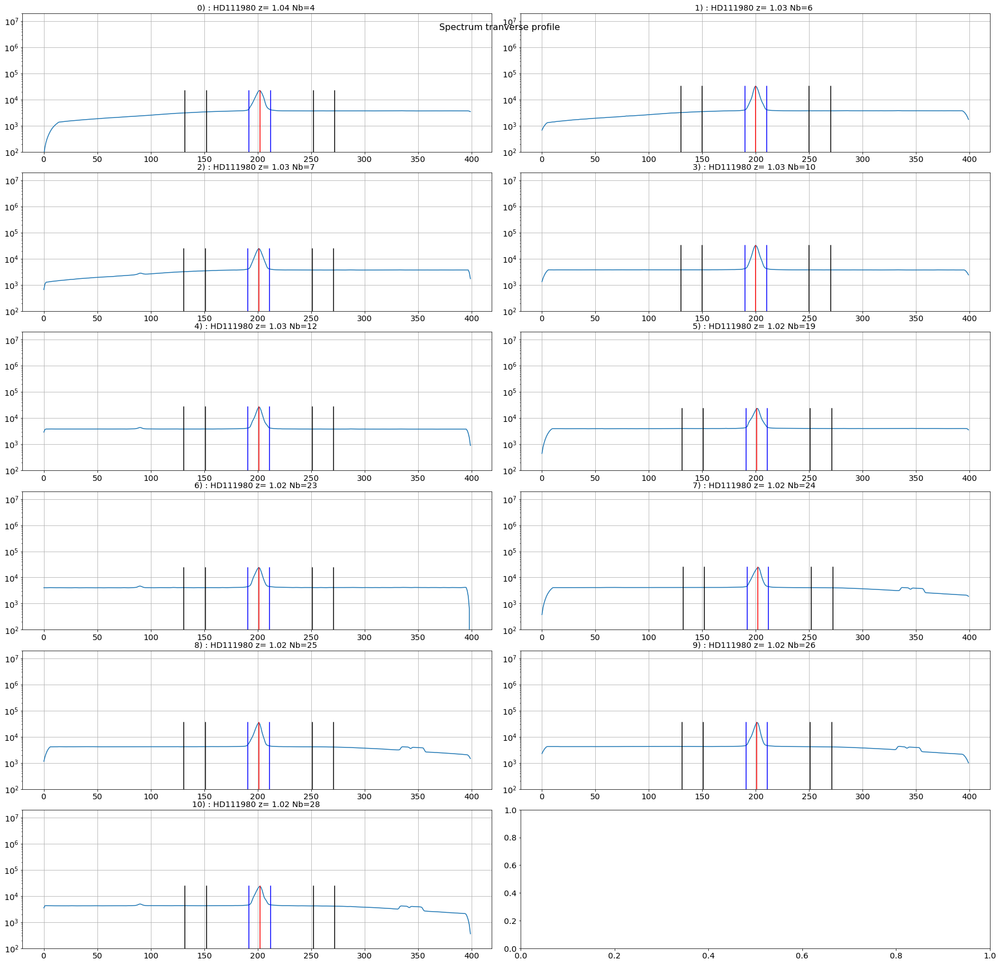

In [95]:
they0=ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=2,
                      DeltaX=1000,w=10,ws=[50,70],right_edge=1800,ylim=(1e2,2e7))

## Extract the longitudinal spectrum with its lateral bands

In [96]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(they0,all_images,all_titles,object_name,all_expo,
                                                      w=10,ws=[50,70],right_edge=1800)

In [97]:
thespectraAv=np.array(thespectraUp+thespectraDown)/2.

/Users/dagoret/anaconda3/envs/py27/lib/python2.7/site-packages/matplotlib/figure.py:457: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


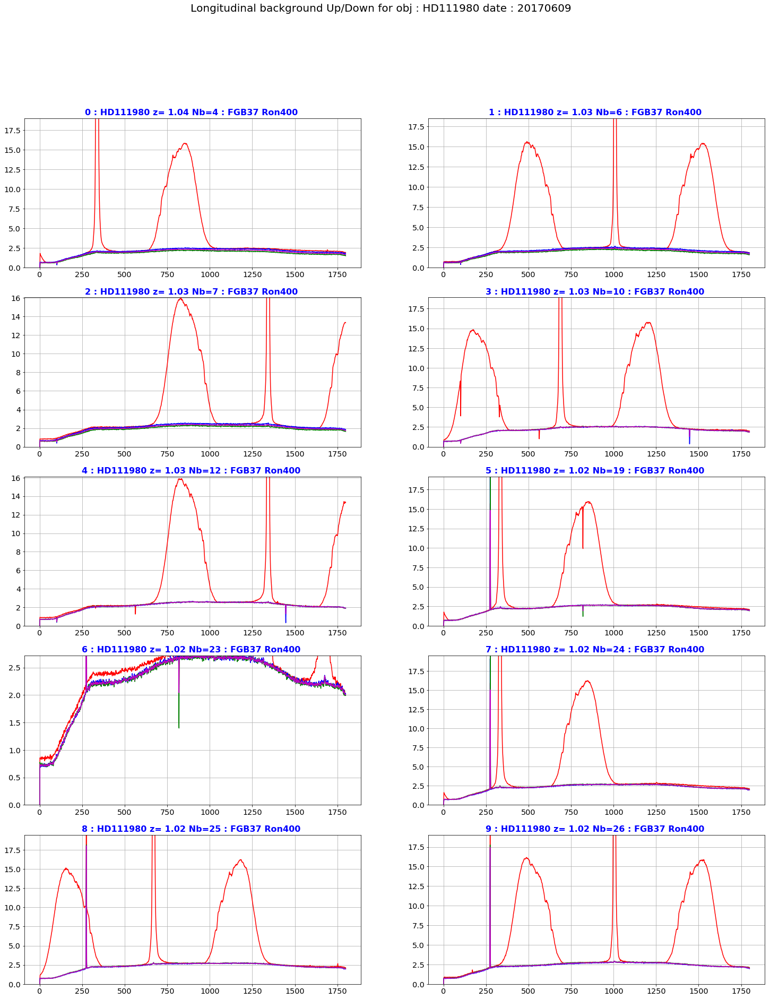

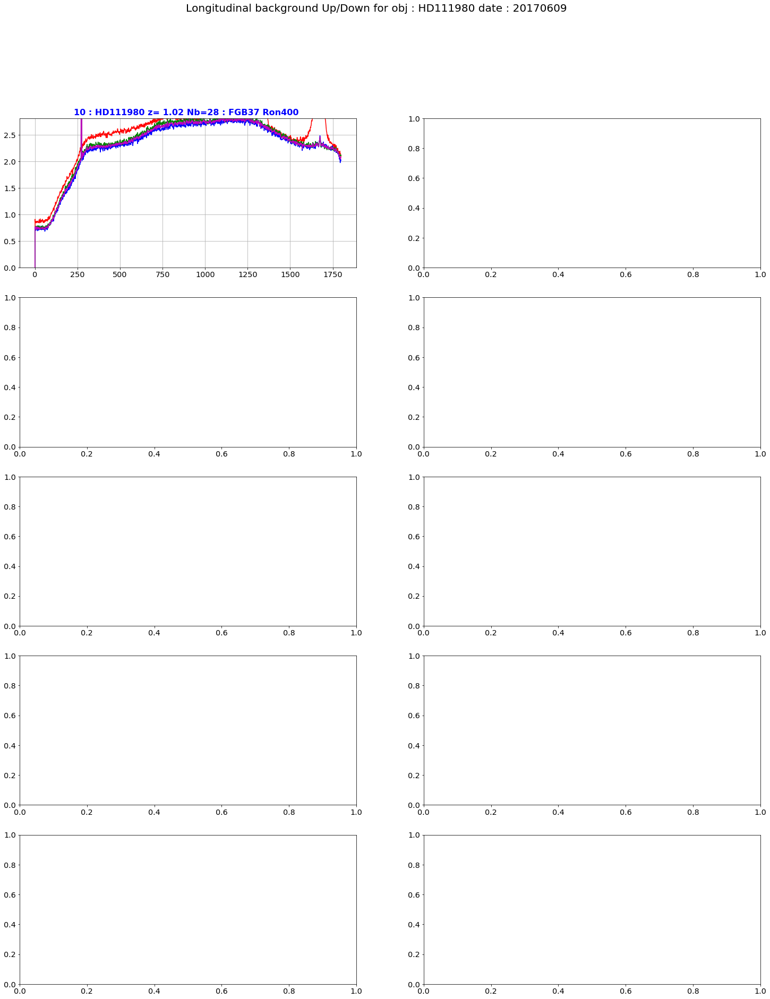

In [98]:
ShowLongitBackgroundinPDF(thespectra,thespectraUp,thespectraDown,thespectraAv,all_titles,object_name,dir_top_images,all_filt,date,'background_longprofile.pdf')

## If OK apply background subtraction

In [99]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

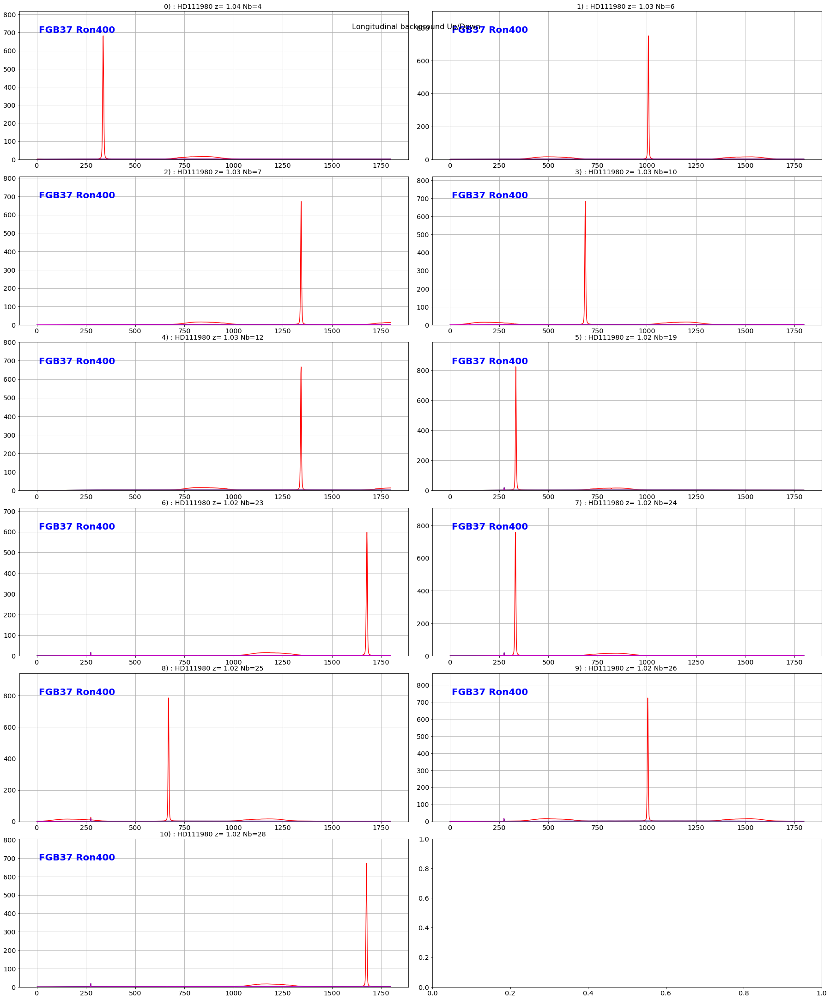

In [100]:
ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=2,right_edge=1800)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

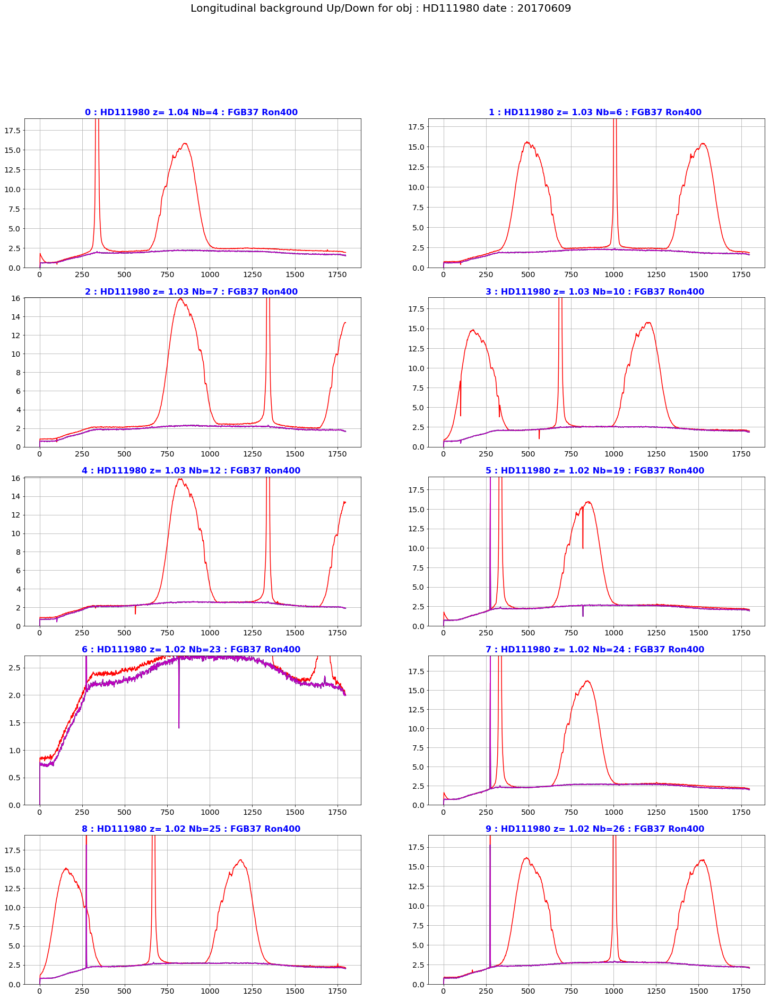

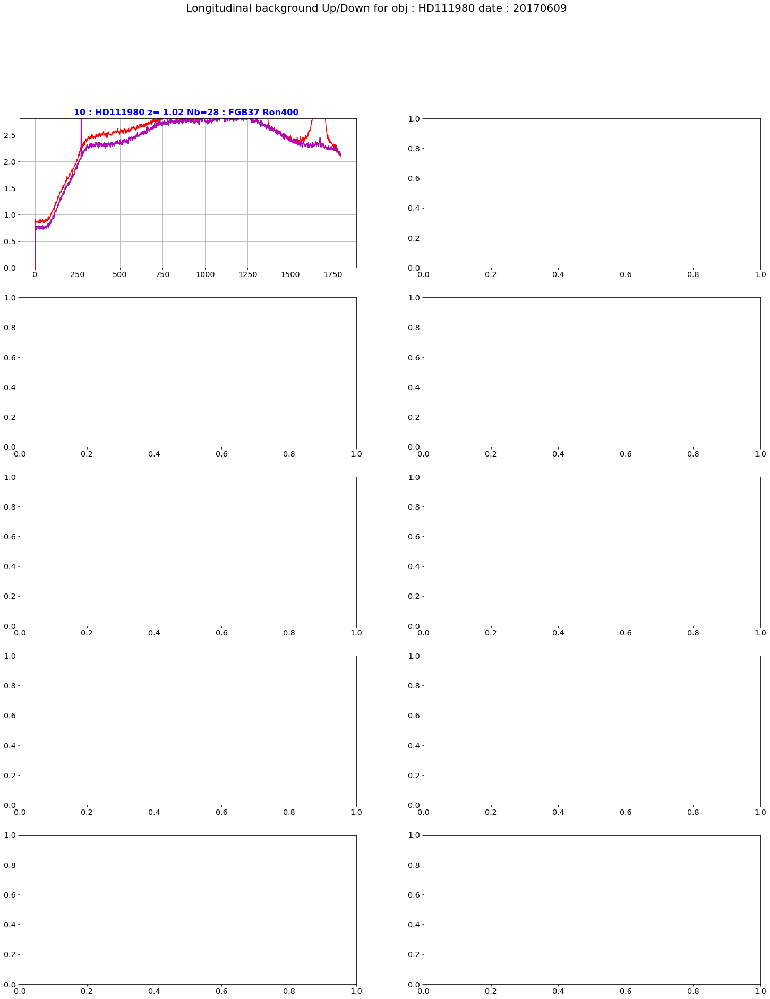

In [101]:
ShowLongitBackgroundinPDF(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,object_name,dir_top_images,all_filt,date,'background_longprofile.pdf')

In [102]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

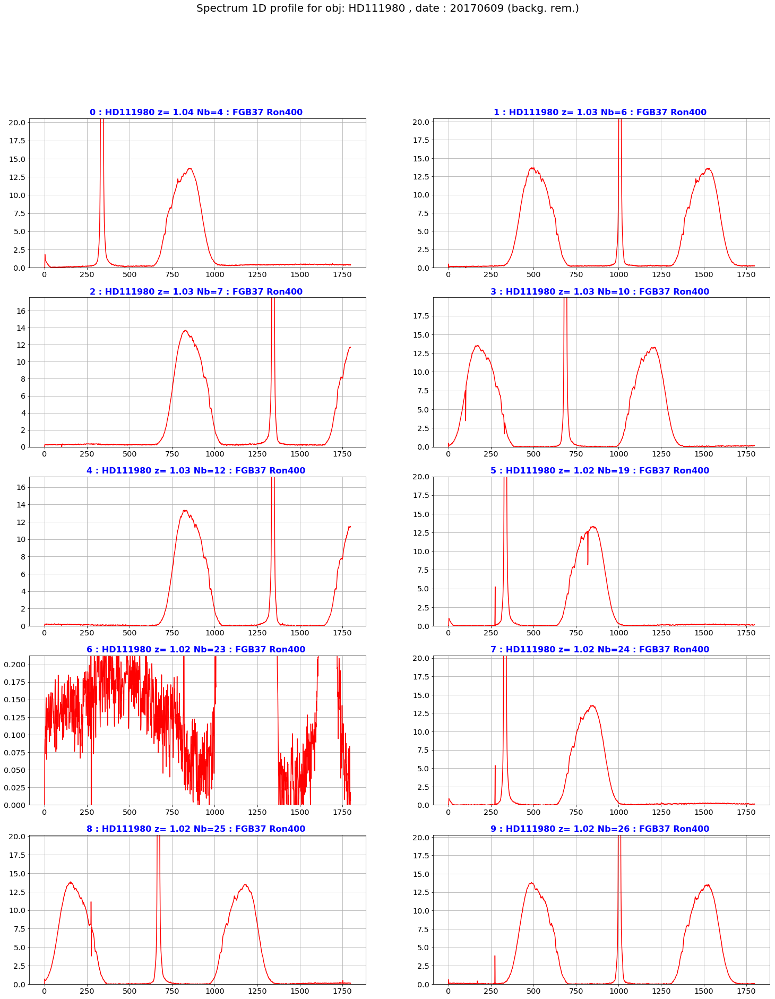

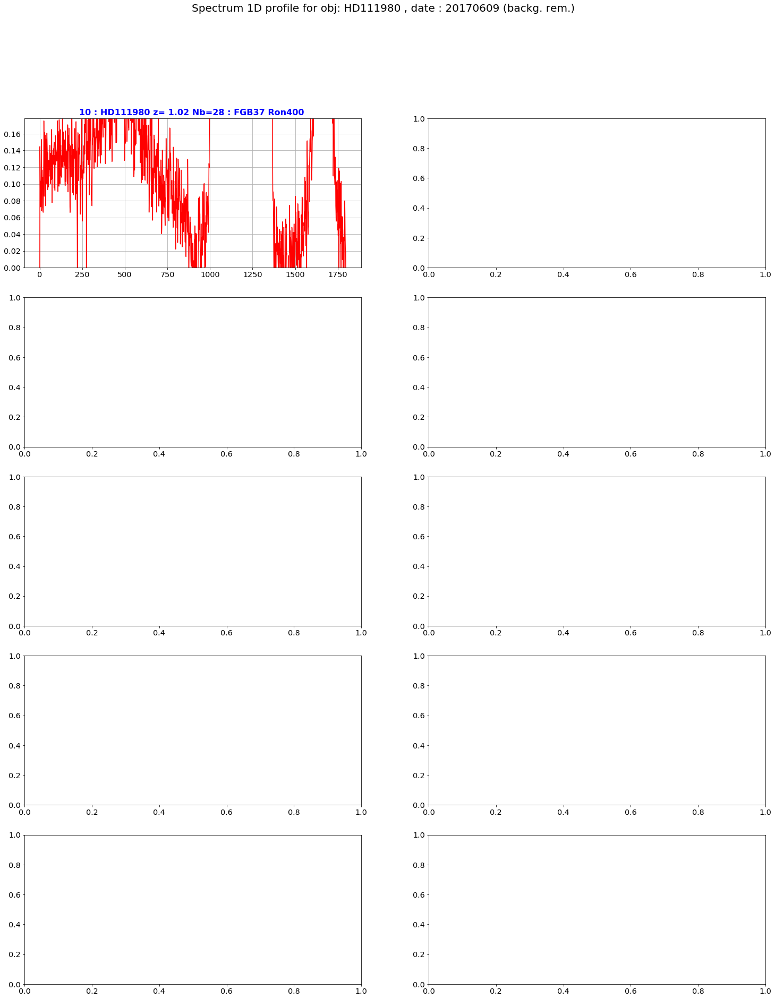

In [103]:
ShowCorrectedSpectrumProfileinPDF(thecorrspectra,all_titles,object_name,dir_top_images,all_filt,date,'correctedspectrum_profile.pdf')


## The real extraction will be done in another notebook

At this stage the work of extraction and rotation seems very good
